In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# we import the data from sql database
transactions = pd.read_csv("transactions.csv")
markets=pd.read_csv("markets.csv")
customers =pd.read_csv("customers.csv")
date =pd.read_csv("date.csv")
products =pd.read_csv("products.csv")


# Clean Data

## Transactions

In [3]:
transactions

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency
0,Prod001,Cus001,Mark001,2017-10-10,100.0,41241.0,INR
1,Prod001,Cus002,Mark002,2018-05-08,3.0,-1.0,INR
2,Prod002,Cus003,Mark003,2018-04-06,1.0,875.0,INR
3,Prod002,Cus003,Mark003,2018-04-11,1.0,583.0,INR
4,Prod002,Cus004,Mark003,2018-06-18,6.0,7176.0,INR
...,...,...,...,...,...,...,...
30359,Prod113,Cus005,Mark004,2019-03-11,2.0,551.0,INR\r
30360,Prod113,Cus006,Mark004,2019-03-11,144.0,42556.0,INR\r
30361,Prod113,Cus018,Mark011,2019-03-11,1.0,79.0,INR\r
30362,Prod113,Cus005,Mark004,2019-03-12,4.0,1111.0,INR\r


In [4]:
transactions.describe()

,sales_qty,sales_amount
count,30363.000000,3.036300e+04
mean,27.947568,8.240263e+03
std,224.681532,3.414365e+04
min,1.000000,-1.000000e+00
25%,1.000000,4.400000e+02
50%,3.000000,1.477000e+03
75%,13.000000,5.352000e+03
max,14049.000000,1.510944e+06


In [5]:
# we  see the max value for (sales_qty , sales_amount) ,its to high
# we will explor it to see where is the wrong
transactions.nlargest(n=20,columns="sales_qty")

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency
22036,Prod090,Cus001,Mark010,2019-11-29,14049.0,628657.0,INR\r
21549,Prod090,Cus005,Mark002,2018-02-08,10667.0,450954.0,INR\r
21665,Prod090,Cus005,Mark002,2018-07-23,10667.0,534463.0,INR\r
21807,Prod090,Cus005,Mark002,2019-01-25,10667.0,534463.0,INR\r
21315,Prod085,Cus026,Mark008,2020-02-29,8000.0,38889.0,INR\r
21992,Prod090,Cus001,Mark010,2019-09-30,6667.0,298310.0,INR\r
21316,Prod085,Cus026,Mark008,2020-04-14,6000.0,29167.0,INR\r
21466,Prod090,Cus005,Mark002,2017-10-30,5333.0,225477.0,INR\r
21477,Prod090,Cus005,Mark002,2017-11-10,5333.0,225477.0,INR\r
21501,Prod090,Cus005,Mark002,2017-12-08,5333.0,225477.0,INR\r


In [6]:
# add new column product_price to track the price for products
transactions["product_price"]= transactions["sales_amount"]/transactions["sales_qty"]

In [7]:
transactions[transactions["product_code"]=="Prod021"]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
1535,Prod021,Cus010,Mark003,2017-10-04,4.0,9032.0,INR\r,2258.000000
1536,Prod021,Cus012,Mark003,2017-10-05,5.0,13199.0,INR\r,2639.800000
1537,Prod021,Cus010,Mark003,2017-10-05,1.0,1644.0,INR\r,1644.000000
1538,Prod021,Cus027,Mark003,2017-10-05,13.0,42954.0,INR\r,3304.153846
1539,Prod021,Cus010,Mark003,2017-10-06,1.0,3287.0,INR\r,3287.000000
1540,Prod021,Cus027,Mark003,2017-10-06,13.0,41880.0,INR\r,3221.538462
1541,Prod021,Cus011,Mark003,2017-10-06,3.0,8713.0,INR\r,2904.333333
1542,Prod021,Cus003,Mark003,2017-10-06,13.0,30528.0,INR\r,2348.307692
1543,Prod021,Cus003,Mark006,2017-10-10,1.0,0.0,INR\r,0.000000
1544,Prod021,Cus010,Mark003,2017-10-11,3.0,8213.0,INR\r,2737.666667


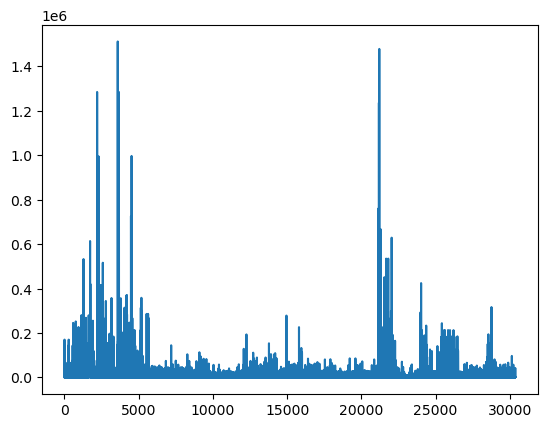

In [8]:
transactions["sales_amount"].plot()
plt.show()

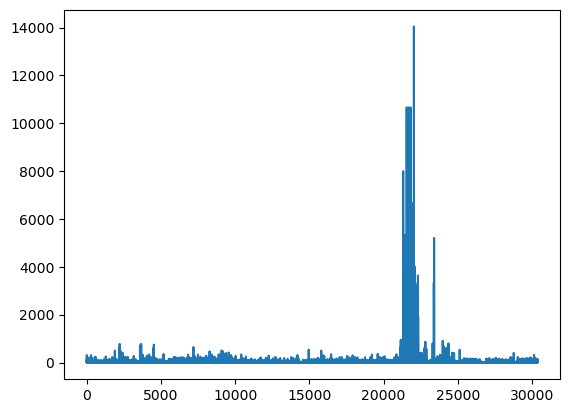

In [9]:
transactions["sales_qty"].plot()
plt.show()

In [10]:
transactions[transactions["product_code"]=="Prod001"]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
0,Prod001,Cus001,Mark001,2017-10-10,100.0,41241.0,INR,412.410000
1,Prod001,Cus002,Mark002,2018-05-08,3.0,-1.0,INR,-0.333333
281,Prod001,Cus001,Mark001,2017-10-10,100.0,41241.0,INR\r,412.410000
282,Prod001,Cus002,Mark002,2018-05-08,3.0,-1.0,INR\r,-0.333333


In [11]:
# there is duplicated row , handiling latter

In [12]:
# after we explore many product price , it look the price change every time and there is no fix price
# also we see the price increase when the sales_qty increase
# so i will keep it the same without any change

In [13]:
transactions["sales_qty"].value_counts().sort_index()

1.0        10914
2.0         2443
3.0         2212
4.0         1115
5.0          907
           ...  
6000.0         1
6667.0         1
8000.0         1
10667.0        3
14049.0        1
Name: sales_qty, Length: 396, dtype: int64

In [14]:
transactions["sales_amount"].value_counts().sort_index()

-1.0            2
 0.0          416
 5.0            1
 9.0            1
 14.0           1
             ... 
 996102.0       1
 1235347.0      1
 1283875.0      2
 1477394.0      1
 1510944.0      1
Name: sales_amount, Length: 4411, dtype: int64

In [15]:
# we see here there is a (-1 ,0) im sales amount and surly there in no 0 or -1 sales amount
# so we will drop this indeies if the sales amount less or equel 0 value
drop_tran_index= transactions[transactions["sales_amount"]<=0].index
drop_tran_index

Int64Index([    1,   159,   196,   239,   282,   440,   477,   520,   585,
             1543,
            ...
            29287, 29332, 29375, 29446, 29636, 29714, 30022, 30172, 30303,
            30335],
           dtype='int64', length=418)

In [16]:
transactions.drop(index=drop_tran_index,inplace=True)

In [17]:
transactions[transactions["sales_amount"]<=0].sum()

product_code     0.0
customer_code    0.0
market_code      0.0
order_date       0.0
sales_qty        0.0
sales_amount     0.0
currency         0.0
product_price    0.0
dtype: float64

In [18]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29946 entries, 0 to 30363
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29946 non-null  object 
 1   customer_code  29946 non-null  object 
 2   market_code    29946 non-null  object 
 3   order_date     29946 non-null  object 
 4   sales_qty      29945 non-null  float64
 5   sales_amount   29945 non-null  float64
 6   currency       29945 non-null  object 
 7   product_price  29945 non-null  float64
dtypes: float64(3), object(5)
memory usage: 2.1+ MB


In [19]:
transactions.describe()

,sales_qty,sales_amount,product_price
count,29945.000000,2.994500e+04,29945.000000
mean,28.250493,8.355288e+03,529.896613
std,226.100466,3.436715e+04,557.696943
min,1.000000,5.000000e+00,4.161897
25%,1.000000,4.490000e+02,231.943750
50%,3.000000,1.528000e+03,329.000000
75%,14.000000,5.477000e+03,553.000000
max,14049.000000,1.510944e+06,4759.000000


In [20]:
transactions["currency"].value_counts()

INR\r    29666
INR        275
USD          2
USD\r        2
Name: currency, dtype: int64

In [21]:
# there is some wrong value like ( INR\r  , USD\r )
# we will fixed INR\r => INR    ,  USD\r  => USD
mapped={"INR\r":"INR","INR":"INR","USD\r":"USD","USD":"USD"}
transactions["currency"]=transactions["currency"].map(mapped)

In [22]:
transactions["currency"].value_counts()

INR    29941
USD        4
Name: currency, dtype: int64

In [23]:
# we need to transform the currency from USD to INR
#  1 USD = 75 INR
transactions[transactions["currency"]== "USD"]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
5,Prod003,Cus005,Mark004,2017-11-20,59.0,500.0,USD,8.474576
6,Prod003,Cus005,Mark004,2017-11-22,36.0,250.0,USD,6.944444
286,Prod003,Cus005,Mark004,2017-11-20,59.0,500.0,USD,8.474576
287,Prod003,Cus005,Mark004,2017-11-22,36.0,250.0,USD,6.944444


In [24]:
transactions["sales_amount"] = np.where(transactions["currency"] == "USD",
                                        transactions["sales_amount"] * 75,
                                        transactions["sales_amount"])
# we can see there is duplicate rows.

In [25]:
transactions[transactions["currency"]== "USD"]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
5,Prod003,Cus005,Mark004,2017-11-20,59.0,37500.0,USD,8.474576
6,Prod003,Cus005,Mark004,2017-11-22,36.0,18750.0,USD,6.944444
286,Prod003,Cus005,Mark004,2017-11-20,59.0,37500.0,USD,8.474576
287,Prod003,Cus005,Mark004,2017-11-22,36.0,18750.0,USD,6.944444


In [26]:
# now transfer the USD currency to INR
transactions["currency"] = np.where(transactions["currency"] == "USD",
                                        "INR",
                                        transactions["currency"])


In [27]:
transactions[transactions["currency"]== "USD"].sum()

product_code     0.0
customer_code    0.0
market_code      0.0
order_date       0.0
sales_qty        0.0
sales_amount     0.0
currency         0.0
product_price    0.0
dtype: float64

In [28]:
transactions["currency"].value_counts()

INR    29945
Name: currency, dtype: int64

In [29]:
transactions["sales_qty"].isna().sum()

1

In [30]:
# there is null value we will replace it with moda
sales_qty_mode = transactions["sales_qty"].mode().iloc[0]
transactions["sales_qty"].fillna(sales_qty_mode,inplace=True)

In [31]:
# make sure its fill it 
transactions["sales_qty"].isna().sum()

0

In [32]:
transactions.sample(20)

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
21632,Prod090,Cus004,Mark010,2018-06-06,193.0,11315.0,INR,58.626943
5978,Prod053,Cus019,Mark011,2017-12-13,19.0,4773.0,INR,251.210526
2244,Prod040,Cus001,Mark001,2018-02-12,40.0,28042.0,INR,701.050000
707,Prod018,Cus022,Mark002,2018-04-12,3.0,6125.0,INR,2041.666667
27343,Prod105,Cus034,Mark010,2017-12-29,7.0,1704.0,INR,243.428571
12872,Prod057,Cus020,Mark011,2018-10-01,5.0,2532.0,INR,506.400000
13019,Prod057,Cus002,Mark007,2018-12-04,15.0,8389.0,INR,559.266667
17271,Prod065,Cus010,Mark003,2018-01-04,11.0,2671.0,INR,242.818182
18049,Prod065,Cus023,Mark011,2018-07-16,4.0,1574.0,INR,393.500000
21543,Prod090,Cus004,Mark010,2018-02-06,13.0,708.0,INR,54.461538


In [33]:
# show the unique value for each columns to make sure there is no wrong in the values
# we can drop some columns like ( order_date , sales_qyt , sales_amount ) beacuse there are contiunes value
for i in transactions.drop(columns=["order_date","sales_qty","sales_amount"]).columns:
    print(i)
    print( transactions[i].unique())
    print("*"*10)

product_code
['Prod001' 'Prod002' 'Prod003' 'Prod004' 'Prod005' 'Prod006' 'Prod007'
 'Prod008' 'Prod009' 'Prod010' 'Prod011' 'Prod012' 'Prod013' 'Prod014'
 'Prod015' 'Prod016' 'Prod017' 'Prod018' 'Prod019' 'Prod020' 'Prod021'
 'Prod022' 'Prod023' 'Prod024' 'Prod025' 'Prod026' 'Prod027' 'Prod028'
 'Prod029' 'Prod030' 'Prod031' 'Prod032' 'Prod033' 'Prod034' 'Prod035'
 'Prod036' 'Prod037' 'Prod038' 'Prod039' 'Prod040' 'Prod041' 'Prod042'
 'Prod043' 'Prod044' 'Prod045' 'Prod046' 'Prod047' 'Prod048' 'Prod049'
 'Prod050' 'Prod051' 'Prod052' 'Prod053' 'Prod054' 'Prod055' 'Prod056'
 'Prod057' 'Prod058' 'Prod059' 'Prod060' 'Prod061' 'Prod062' 'Prod063'
 'Prod064' 'Prod065' 'Prod066' 'Prod067' 'Prod068' 'Prod069' 'Prod070'
 'Prod071' 'Prod072' 'Prod073' 'Prod074' 'Prod075' 'Prod076' 'Prod077'
 'Prod078' 'Prod079' 'Prod080' 'Prod081' 'Prod082' 'Prod083' 'Prod084'
 'Prod085' 'Prod086' 'Prod087' 'Prod088' 'Prod089' 'Prod090' 'Prod091'
 'Prod092' 'Prod093' 'Prod094' 'Prod095' 'Prod096' 'Prod097' 'Pr

In [34]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29946 entries, 0 to 30363
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29946 non-null  object 
 1   customer_code  29946 non-null  object 
 2   market_code    29946 non-null  object 
 3   order_date     29946 non-null  object 
 4   sales_qty      29946 non-null  float64
 5   sales_amount   29945 non-null  float64
 6   currency       29945 non-null  object 
 7   product_price  29945 non-null  float64
dtypes: float64(3), object(5)
memory usage: 2.1+ MB


In [35]:
# we see there is null value in ( sales_amount , currency, product_price ) columns
# currency column we can change it to INR
transactions[transactions["currency"].isna()]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,NaN,NaN,NaN


In [36]:
transactions[transactions["sales_amount"].isna()]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,NaN,NaN,NaN


In [37]:
transactions[transactions["product_price"].isna()]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,NaN,NaN,NaN


In [38]:
# its the same row for null value
# we will fill the null value for sales_amount in mean of sales_amount when the
# sales_amount == 1  and market_code == Mark004
market_sales_grp = transactions.groupby(["market_code","sales_qty"]).sales_amount.mean()
market_sales_grp

market_code  sales_qty
Mark001      1.0           1020.222222
             3.0           2154.400000
             4.0           2171.500000
             6.0            667.000000
             7.0           1582.600000
                              ...     
Mark015      500.0        19167.000000
             550.0        19167.000000
             667.0        25556.000000
             833.0        31944.000000
             1833.0       63889.000000
Name: sales_amount, Length: 1273, dtype: float64

In [39]:
mean = market_sales_grp.loc[("Mark004",1)]
mean

569.9314397649364

In [40]:
mask_sales_amount = transactions["sales_amount"].isna()

In [41]:
transactions.loc[mask_sales_amount,"sales_amount"] = mean

In [42]:
# inspect it again
transactions.loc[mask_sales_amount]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,569.93144,NaN,NaN


In [43]:
# curreny column
mask_currency = transactions["currency"].isna()

In [44]:
transactions.loc[mask_currency,"currency"] = "INR"

In [45]:
# inspect it again
transactions.loc[mask_currency]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,569.93144,INR,NaN


In [46]:
# product price
mask_product_price=transactions["product_price"].isna()

In [47]:
transactions.loc[mask_product_price,"product_price"] = transactions["sales_amount"]/transactions["sales_qty"]

In [48]:
# inspect it again
transactions.loc[mask_product_price]

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
30363,Prod113,Cus006,Mark004,2019-0,1.0,569.93144,INR,569.93144


In [49]:
transactions.isna().sum()

product_code     0
customer_code    0
market_code      0
order_date       0
sales_qty        0
sales_amount     0
currency         0
product_price    0
dtype: int64

In [50]:
# handeling the dublicat
transactions_dup = transactions[transactions.duplicated()]
transactions_dup

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
281,Prod001,Cus001,Mark001,2017-10-10,100.0,41241.0,INR,412.410000
283,Prod002,Cus003,Mark003,2018-04-06,1.0,875.0,INR,875.000000
284,Prod002,Cus003,Mark003,2018-04-11,1.0,583.0,INR,583.000000
285,Prod002,Cus004,Mark003,2018-06-18,6.0,7176.0,INR,1196.000000
286,Prod003,Cus005,Mark004,2017-11-20,59.0,37500.0,INR,8.474576
...,...,...,...,...,...,...,...,...
557,Prod013,Cus006,Mark004,2017-10-23,20.0,25130.0,INR,1256.500000
558,Prod013,Cus007,Mark004,2017-10-25,1.0,986.0,INR,986.000000
559,Prod013,Cus020,Mark004,2017-11-02,13.0,23898.0,INR,1838.307692
560,Prod013,Cus005,Mark004,2017-11-03,1.0,296.0,INR,296.000000


In [51]:
# drop the duplicated rows
transactions.drop(index=transactions_dup.index,inplace=True)

In [52]:
transactions.duplicated().sum()

0

In [53]:
transactions

,product_code,customer_code,market_code,order_date,sales_qty,sales_amount,currency,product_price
0,Prod001,Cus001,Mark001,2017-10-10,100.0,41241.00000,INR,412.410000
2,Prod002,Cus003,Mark003,2018-04-06,1.0,875.00000,INR,875.000000
3,Prod002,Cus003,Mark003,2018-04-11,1.0,583.00000,INR,583.000000
4,Prod002,Cus004,Mark003,2018-06-18,6.0,7176.00000,INR,1196.000000
5,Prod003,Cus005,Mark004,2017-11-20,59.0,37500.00000,INR,8.474576
...,...,...,...,...,...,...,...,...
30359,Prod113,Cus005,Mark004,2019-03-11,2.0,551.00000,INR,275.500000
30360,Prod113,Cus006,Mark004,2019-03-11,144.0,42556.00000,INR,295.527778
30361,Prod113,Cus018,Mark011,2019-03-11,1.0,79.00000,INR,79.000000
30362,Prod113,Cus005,Mark004,2019-03-12,4.0,1111.00000,INR,277.750000


In [54]:
# Done for transactions

## Markets

In [55]:
markets

,markets_code,markets_name,zone
0,Mark001,Chennai,South
1,Mark002,Mumbai,Central
2,Mark003,Ahmedabad,North
3,Mark004,Delhi NCR,North
4,Mark005,Kanpur,North
5,Mark006,Bengaluru,South
6,Mark007,Bhopal,Central
7,Mark008,Lucknow,North
8,Mark009,Patna,North
9,Mark010,Kochi,South


In [56]:
markets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17 entries, 0 to 16
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   markets_code  17 non-null     object
 1   markets_name  17 non-null     object
 2   zone          15 non-null     object
dtypes: object(3)
memory usage: 540.0+ bytes


In [57]:
# there is null value in zone column
markets[markets["zone"].isna()]

,markets_code,markets_name,zone
15,Mark097,New York,NaN
16,Mark999,Paris,NaN


In [58]:
# we will dorp beacuse there no markets (Mark097,Mark999) in transactions
transactions[(transactions["market_code"] == "Mark097") | (transactions["market_code"] == "Mark999")]["market_code"].sum()

0

In [59]:
drop_mark_index =markets[markets["zone"].isna()].index
drop_mark_index

Int64Index([15, 16], dtype='int64')

In [60]:
markets.drop(index=drop_mark_index,inplace=True)
markets

,markets_code,markets_name,zone
0,Mark001,Chennai,South
1,Mark002,Mumbai,Central
2,Mark003,Ahmedabad,North
3,Mark004,Delhi NCR,North
4,Mark005,Kanpur,North
5,Mark006,Bengaluru,South
6,Mark007,Bhopal,Central
7,Mark008,Lucknow,North
8,Mark009,Patna,North
9,Mark010,Kochi,South


In [61]:
markets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   markets_code  15 non-null     object
 1   markets_name  15 non-null     object
 2   zone          15 non-null     object
dtypes: object(3)
memory usage: 492.0+ bytes


In [62]:
# show the unique value , to inspect any erro
for col in markets.columns:
    print(col)
    print(markets[col].unique())
    print("*"*10)

markets_code
['Mark001' 'Mark002' 'Mark003' 'Mark004' 'Mark005' 'Mark006' 'Mark007'
 'Mark008' 'Mark009' 'Mark010' 'Mark011' 'Mark012' 'Mark013' 'Mark014'
 'Mark015']
**********
markets_name
['Chennai' 'Mumbai' 'Ahmedabad' 'Delhi NCR' 'Kanpur' 'Bengaluru' 'Bhopal'
 'Lucknow' 'Patna' 'Kochi' 'Nagpur' 'Surat' 'Hyderabad' 'Bhubaneshwar']
**********
zone
['South' 'Central' 'North']
**********


# Bulid the sales data // Merge transactions tables => markets table

In [63]:
sales= transactions.merge(markets,how="left",left_on="market_code",right_on="markets_code").drop(
columns=["market_code","markets_code"])
sales

,product_code,customer_code,order_date,sales_qty,sales_amount,currency,product_price,markets_name,zone
0,Prod001,Cus001,2017-10-10,100.0,41241.00000,INR,412.410000,Chennai,South
1,Prod002,Cus003,2018-04-06,1.0,875.00000,INR,875.000000,Ahmedabad,North
2,Prod002,Cus003,2018-04-11,1.0,583.00000,INR,583.000000,Ahmedabad,North
3,Prod002,Cus004,2018-06-18,6.0,7176.00000,INR,1196.000000,Ahmedabad,North
4,Prod003,Cus005,2017-11-20,59.0,37500.00000,INR,8.474576,Delhi NCR,North
...,...,...,...,...,...,...,...,...,...
29664,Prod113,Cus005,2019-03-11,2.0,551.00000,INR,275.500000,Delhi NCR,North
29665,Prod113,Cus006,2019-03-11,144.0,42556.00000,INR,295.527778,Delhi NCR,North
29666,Prod113,Cus018,2019-03-11,1.0,79.00000,INR,79.000000,Nagpur,Central
29667,Prod113,Cus005,2019-03-12,4.0,1111.00000,INR,277.750000,Delhi NCR,North


In [64]:
sales.isna().sum()

product_code     0
customer_code    0
order_date       0
sales_qty        0
sales_amount     0
currency         0
product_price    0
markets_name     0
zone             0
dtype: int64

In [65]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29669 entries, 0 to 29668
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29669 non-null  object 
 1   customer_code  29669 non-null  object 
 2   order_date     29669 non-null  object 
 3   sales_qty      29669 non-null  float64
 4   sales_amount   29669 non-null  float64
 5   currency       29669 non-null  object 
 6   product_price  29669 non-null  float64
 7   markets_name   29669 non-null  object 
 8   zone           29669 non-null  object 
dtypes: float64(3), object(6)
memory usage: 2.3+ MB


# Customers

In [66]:
customers

,customer_code,custmer_name,customer_type
0,Cus001,Surge Stores,Brick & Mortar
1,Cus002,Nomad Stores,Brick & Mortar
2,Cus003,Excel Stores,Brick & Mortar
3,Cus004,Surface Stores,Brick & Mortar
4,Cus005,Premium Stores,Brick & Mortar
5,Cus006,Electricalsara Stores,Brick & Mortar
6,Cus007,Info Stores,Brick & Mortar
7,Cus008,Acclaimed Stores,Brick & Mortar
8,Cus009,Electricalsquipo Stores,Brick & Mortar
9,Cus010,Atlas Stores,Brick & Mortar


In [67]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38 entries, 0 to 37
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customer_code  38 non-null     object
 1   custmer_name   38 non-null     object
 2   customer_type  38 non-null     object
dtypes: object(3)
memory usage: 1.0+ KB


In [68]:
# there is no null value

In [69]:
# show the unique value
for col in customers.columns:
    print(col)
    print(customers[col].unique())
    print("*"*10)

customer_code
['Cus001' 'Cus002' 'Cus003' 'Cus004' 'Cus005' 'Cus006' 'Cus007' 'Cus008'
 'Cus009' 'Cus010' 'Cus011' 'Cus012' 'Cus013' 'Cus014' 'Cus015' 'Cus016'
 'Cus017' 'Cus018' 'Cus019' 'Cus020' 'Cus021' 'Cus022' 'Cus023' 'Cus024'
 'Cus025' 'Cus026' 'Cus027' 'Cus028' 'Cus029' 'Cus030' 'Cus031' 'Cus032'
 'Cus033' 'Cus034' 'Cus035' 'Cus036' 'Cus037' 'Cus038']
**********
custmer_name
['Surge Stores' 'Nomad Stores' 'Excel Stores' 'Surface Stores'
 'Premium Stores' 'Electricalsara Stores' 'Info Stores' 'Acclaimed Stores'
 'Electricalsquipo Stores' 'Atlas Stores' 'Flawless Stores'
 'Integration Stores' 'Unity Stores' 'Forward Stores'
 'Electricalsbea Stores' 'Logic Stores' 'Epic Stores'
 'Electricalslance Stores' 'Electricalsopedia Stores' 'Nixon' 'Modular'
 'Electricalslytical' 'Sound' 'Power' 'Path' 'Insight' 'Control' 'Sage'
 'Electricalsocity' 'Synthetic' 'Zone' 'Elite' 'All-Out' 'Expression'
 'Relief' 'Novus' 'Propel' 'Leader']
**********
customer_type
['Brick & Mortar' 'E-Commerce']


# Bulid the sales data // Merge customers tables => sales table

In [70]:
sales = sales.merge(customers,how="left",on="customer_code").drop(columns=["customer_code"])
sales

,product_code,order_date,sales_qty,sales_amount,currency,product_price,markets_name,zone,custmer_name,customer_type
0,Prod001,2017-10-10,100.0,41241.00000,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar
1,Prod002,2018-04-06,1.0,875.00000,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar
2,Prod002,2018-04-11,1.0,583.00000,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar
3,Prod002,2018-06-18,6.0,7176.00000,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar
4,Prod003,2017-11-20,59.0,37500.00000,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar
...,...,...,...,...,...,...,...,...,...,...
29664,Prod113,2019-03-11,2.0,551.00000,INR,275.500000,Delhi NCR,North,Premium Stores,Brick & Mortar
29665,Prod113,2019-03-11,144.0,42556.00000,INR,295.527778,Delhi NCR,North,Electricalsara Stores,Brick & Mortar
29666,Prod113,2019-03-11,1.0,79.00000,INR,79.000000,Nagpur,Central,Electricalslance Stores,Brick & Mortar
29667,Prod113,2019-03-12,4.0,1111.00000,INR,277.750000,Delhi NCR,North,Premium Stores,Brick & Mortar


In [71]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29669 entries, 0 to 29668
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29669 non-null  object 
 1   order_date     29669 non-null  object 
 2   sales_qty      29669 non-null  float64
 3   sales_amount   29669 non-null  float64
 4   currency       29669 non-null  object 
 5   product_price  29669 non-null  float64
 6   markets_name   29669 non-null  object 
 7   zone           29669 non-null  object 
 8   custmer_name   29669 non-null  object 
 9   customer_type  29669 non-null  object 
dtypes: float64(3), object(7)
memory usage: 2.5+ MB


In [72]:
sales.isna().sum()

product_code     0
order_date       0
sales_qty        0
sales_amount     0
currency         0
product_price    0
markets_name     0
zone             0
custmer_name     0
customer_type    0
dtype: int64

# Products

In [73]:
products

,product_code,product_type
0,Prod001,Own Brand\r
1,Prod002,Own Brand\r
2,Prod003,Own Brand\r
3,Prod004,Own Brand\r
4,Prod005,Own Brand\r
...,...,...
274,Prod275,Own Brand\r
275,Prod276,Own Brand\r
276,Prod277,Own Brand\r
277,Prod278,Distribution\r


In [74]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 279 entries, 0 to 278
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   product_code  279 non-null    object
 1   product_type  279 non-null    object
dtypes: object(2)
memory usage: 4.5+ KB


In [75]:
# Trim any space from all columns in the DataFrame
for col in products.columns:
    products[col].str.strip()

In [76]:
# show the unique value to inspect any error
for col in products.columns:
    print(col)
    print(products[col].unique())
    print("*"*10)

product_code
['Prod001' 'Prod002' 'Prod003' 'Prod004' 'Prod005' 'Prod006' 'Prod007'
 'Prod008' 'Prod009' 'Prod010' 'Prod011' 'Prod012' 'Prod013' 'Prod014'
 'Prod015' 'Prod016' 'Prod017' 'Prod018' 'Prod019' 'Prod020' 'Prod021'
 'Prod022' 'Prod023' 'Prod024' 'Prod025' 'Prod026' 'Prod027' 'Prod028'
 'Prod029' 'Prod030' 'Prod031' 'Prod032' 'Prod033' 'Prod034' 'Prod035'
 'Prod036' 'Prod037' 'Prod038' 'Prod039' 'Prod040' 'Prod041' 'Prod042'
 'Prod043' 'Prod044' 'Prod045' 'Prod046' 'Prod047' 'Prod048' 'Prod049'
 'Prod050' 'Prod051' 'Prod052' 'Prod053' 'Prod054' 'Prod055' 'Prod056'
 'Prod057' 'Prod058' 'Prod059' 'Prod060' 'Prod061' 'Prod062' 'Prod063'
 'Prod064' 'Prod065' 'Prod066' 'Prod067' 'Prod068' 'Prod069' 'Prod070'
 'Prod071' 'Prod072' 'Prod073' 'Prod074' 'Prod075' 'Prod076' 'Prod077'
 'Prod078' 'Prod079' 'Prod080' 'Prod081' 'Prod082' 'Prod083' 'Prod084'
 'Prod085' 'Prod086' 'Prod087' 'Prod088' 'Prod089' 'Prod090' 'Prod091'
 'Prod092' 'Prod093' 'Prod094' 'Prod095' 'Prod096' 'Prod097' 'Pr

In [77]:
# we see there is \r in the end of each word in product_type column
# we will repalce it 'Own Brand\r' => "Own Brand" , 'Distribution\r' => "Distribution"
mapper = {"Distribution\r":"Distribution","Own Brand\r":"Own Brand"}
products["product_type"]= products["product_type"].map(mapper)

In [78]:
for col in products.columns:
    print(col)
    print(products[col].unique())
    print("*"*10)

product_code
['Prod001' 'Prod002' 'Prod003' 'Prod004' 'Prod005' 'Prod006' 'Prod007'
 'Prod008' 'Prod009' 'Prod010' 'Prod011' 'Prod012' 'Prod013' 'Prod014'
 'Prod015' 'Prod016' 'Prod017' 'Prod018' 'Prod019' 'Prod020' 'Prod021'
 'Prod022' 'Prod023' 'Prod024' 'Prod025' 'Prod026' 'Prod027' 'Prod028'
 'Prod029' 'Prod030' 'Prod031' 'Prod032' 'Prod033' 'Prod034' 'Prod035'
 'Prod036' 'Prod037' 'Prod038' 'Prod039' 'Prod040' 'Prod041' 'Prod042'
 'Prod043' 'Prod044' 'Prod045' 'Prod046' 'Prod047' 'Prod048' 'Prod049'
 'Prod050' 'Prod051' 'Prod052' 'Prod053' 'Prod054' 'Prod055' 'Prod056'
 'Prod057' 'Prod058' 'Prod059' 'Prod060' 'Prod061' 'Prod062' 'Prod063'
 'Prod064' 'Prod065' 'Prod066' 'Prod067' 'Prod068' 'Prod069' 'Prod070'
 'Prod071' 'Prod072' 'Prod073' 'Prod074' 'Prod075' 'Prod076' 'Prod077'
 'Prod078' 'Prod079' 'Prod080' 'Prod081' 'Prod082' 'Prod083' 'Prod084'
 'Prod085' 'Prod086' 'Prod087' 'Prod088' 'Prod089' 'Prod090' 'Prod091'
 'Prod092' 'Prod093' 'Prod094' 'Prod095' 'Prod096' 'Prod097' 'Pr

# Bulid the sales data // Merge Producta tables => sales table

In [79]:
sales= sales.merge(products,how="left",on="product_code")#.drop(columns=["product_code"])
sales

,product_code,order_date,sales_qty,sales_amount,currency,product_price,markets_name,zone,custmer_name,customer_type,product_type
0,Prod001,2017-10-10,100.0,41241.00000,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar,Own Brand
1,Prod002,2018-04-06,1.0,875.00000,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand
2,Prod002,2018-04-11,1.0,583.00000,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand
3,Prod002,2018-06-18,6.0,7176.00000,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar,Own Brand
4,Prod003,2017-11-20,59.0,37500.00000,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar,Own Brand
...,...,...,...,...,...,...,...,...,...,...,...
29664,Prod113,2019-03-11,2.0,551.00000,INR,275.500000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution
29665,Prod113,2019-03-11,144.0,42556.00000,INR,295.527778,Delhi NCR,North,Electricalsara Stores,Brick & Mortar,Distribution
29666,Prod113,2019-03-11,1.0,79.00000,INR,79.000000,Nagpur,Central,Electricalslance Stores,Brick & Mortar,Distribution
29667,Prod113,2019-03-12,4.0,1111.00000,INR,277.750000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution


In [80]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29669 entries, 0 to 29668
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29669 non-null  object 
 1   order_date     29669 non-null  object 
 2   sales_qty      29669 non-null  float64
 3   sales_amount   29669 non-null  float64
 4   currency       29669 non-null  object 
 5   product_price  29669 non-null  float64
 6   markets_name   29669 non-null  object 
 7   zone           29669 non-null  object 
 8   custmer_name   29669 non-null  object 
 9   customer_type  29669 non-null  object 
 10  product_type   29669 non-null  object 
dtypes: float64(3), object(8)
memory usage: 2.7+ MB


# Date

In [81]:
date

,date,cy_date,year,month_name,date_yy_mmm
0,2017-06-01,2017-06-01,2017,June,17-Jun\r
1,2017-06-02,2017-06-01,2017,June,17-Jun\r
2,2017-06-03,2017-06-01,2017,June,17-Jun\r
3,2017-06-04,2017-06-01,2017,June,17-Jun\r
4,2017-06-05,2017-06-01,2017,June,17-Jun\r
...,...,...,...,...,...
1121,2020-06-26,2020-06-01,2020,June,20-Jun\r
1122,2020-06-27,2020-06-01,2020,June,20-Jun\r
1123,2020-06-28,2020-06-01,2020,June,20-Jun\r
1124,2020-06-29,2020-06-01,2020,June,20-Jun\r


In [82]:
date.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1126 entries, 0 to 1125
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         1126 non-null   object
 1   cy_date      1126 non-null   object
 2   year         1126 non-null   int64 
 3   month_name   1126 non-null   object
 4   date_yy_mmm  1126 non-null   object
dtypes: int64(1), object(4)
memory usage: 44.1+ KB


In [83]:
# show the unique value for columns
for col in date.columns:
    print(col)
    print(date[col].unique())
    print("*"*10)

date
['2017-06-01' '2017-06-02' '2017-06-03' ... '2020-06-28' '2020-06-29'
 '2020-06-30']
**********
cy_date
['2017-06-01' '2017-07-01' '2017-08-01' '2017-09-01' '2017-10-01'
 '2017-11-01' '2017-12-01' '2018-01-01' '2018-02-01' '2018-03-01'
 '2018-04-01' '2018-05-01' '2018-06-01' '2018-07-01' '2018-08-01'
 '2018-09-01' '2018-10-01' '2018-11-01' '2018-12-01' '2019-01-01'
 '2019-02-01' '2019-03-01' '2019-04-01' '2019-05-01' '2019-06-01'
 '2019-07-01' '2019-08-01' '2019-09-01' '2019-10-01' '2019-11-01'
 '2019-12-01' '2020-01-01' '2020-02-01' '2020-03-01' '2020-04-01'
 '2020-05-01' '2020-06-01']
**********
year
[2017 2018 2019 2020]
**********
month_name
['June' 'July' 'August' 'September' 'October' 'November' 'December'
 'January' 'February' 'March' 'April' 'May']
**********
date_yy_mmm
['17-Jun\r' '17-Jul\r' '17-Aug\r' '17-Sep\r' '17-Oct\r' '17-Nov\r'
 '17-Dec\r' '18-Jan\r' '18-Feb\r' '18-Mar\r' '18-Apr\r' '18-May\r'
 '18-Jun\r' '18-Jul\r' '18-Aug\r' '18-Sep\r' '18-Oct\r' '18-Nov\r'
 '18

In [84]:
# we need to replace the \r form end of date in column date_yy_mmm
date["date_yy_mmm"] = date["date_yy_mmm"].str.rstrip("\r")

In [85]:
date.sample(20)

,date,cy_date,year,month_name,date_yy_mmm
460,2018-09-04,2018-09-01,2018,September,18-Sep
45,2017-07-16,2017-07-01,2017,July,17-Jul
901,2019-11-19,2019-11-01,2019,November,19-Nov
759,2019-06-30,2019-06-01,2019,June,19-Jun
1072,2020-05-08,2020-05-01,2020,May,20-May
158,2017-11-06,2017-11-01,2017,November,17-Nov
516,2018-10-30,2018-10-01,2018,October,18-Oct
939,2019-12-27,2019-12-01,2019,December,19-Dec
507,2018-10-21,2018-10-01,2018,October,18-Oct
936,2019-12-24,2019-12-01,2019,December,19-Dec


# Bulid the sales data // Merge Date tables => sales table

In [86]:
sales = sales.merge(date,how="left", left_on="order_date",right_on="date").drop(columns=["order_date","date"])

In [87]:
sales

,product_code,sales_qty,sales_amount,currency,product_price,markets_name,zone,custmer_name,customer_type,product_type,cy_date,year,month_name,date_yy_mmm
0,Prod001,100.0,41241.00000,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar,Own Brand,2017-10-01,2017.0,October,17-Oct
1,Prod002,1.0,875.00000,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
2,Prod002,1.0,583.00000,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
3,Prod002,6.0,7176.00000,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar,Own Brand,2018-06-01,2018.0,June,18-Jun
4,Prod003,59.0,37500.00000,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar,Own Brand,2017-11-01,2017.0,November,17-Nov
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29664,Prod113,2.0,551.00000,INR,275.500000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29665,Prod113,144.0,42556.00000,INR,295.527778,Delhi NCR,North,Electricalsara Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29666,Prod113,1.0,79.00000,INR,79.000000,Nagpur,Central,Electricalslance Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29667,Prod113,4.0,1111.00000,INR,277.750000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar


In [88]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29669 entries, 0 to 29668
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29669 non-null  object 
 1   sales_qty      29669 non-null  float64
 2   sales_amount   29669 non-null  float64
 3   currency       29669 non-null  object 
 4   product_price  29669 non-null  float64
 5   markets_name   29669 non-null  object 
 6   zone           29669 non-null  object 
 7   custmer_name   29669 non-null  object 
 8   customer_type  29669 non-null  object 
 9   product_type   29669 non-null  object 
 10  cy_date        29668 non-null  object 
 11  year           29668 non-null  float64
 12  month_name     29668 non-null  object 
 13  date_yy_mmm    29668 non-null  object 
dtypes: float64(4), object(10)
memory usage: 3.4+ MB


In [89]:
sales.describe()

,sales_qty,sales_amount,product_price,year
count,29669.000000,2.966900e+04,29669.000000,29668.000000
mean,28.434056,8.375842e+03,526.618192,2018.517190
std,227.121771,3.447153e+04,555.820478,0.857184
min,1.000000,5.000000e+00,4.161897,2017.000000
25%,1.000000,4.440000e+02,231.333333,2018.000000
50%,3.000000,1.532000e+03,325.666667,2018.000000
75%,14.000000,5.514000e+03,546.875000,2019.000000
max,14049.000000,1.510944e+06,4759.000000,2020.000000


In [90]:
# rename custmer_name => customer_name
sales.rename(columns={"custmer_name":"customer_name"},inplace=True)

In [91]:
sales

,product_code,sales_qty,sales_amount,currency,product_price,markets_name,zone,customer_name,customer_type,product_type,cy_date,year,month_name,date_yy_mmm
0,Prod001,100.0,41241.00000,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar,Own Brand,2017-10-01,2017.0,October,17-Oct
1,Prod002,1.0,875.00000,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
2,Prod002,1.0,583.00000,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
3,Prod002,6.0,7176.00000,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar,Own Brand,2018-06-01,2018.0,June,18-Jun
4,Prod003,59.0,37500.00000,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar,Own Brand,2017-11-01,2017.0,November,17-Nov
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29664,Prod113,2.0,551.00000,INR,275.500000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29665,Prod113,144.0,42556.00000,INR,295.527778,Delhi NCR,North,Electricalsara Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29666,Prod113,1.0,79.00000,INR,79.000000,Nagpur,Central,Electricalslance Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29667,Prod113,4.0,1111.00000,INR,277.750000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar


In [92]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29669 entries, 0 to 29668
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29669 non-null  object 
 1   sales_qty      29669 non-null  float64
 2   sales_amount   29669 non-null  float64
 3   currency       29669 non-null  object 
 4   product_price  29669 non-null  float64
 5   markets_name   29669 non-null  object 
 6   zone           29669 non-null  object 
 7   customer_name  29669 non-null  object 
 8   customer_type  29669 non-null  object 
 9   product_type   29669 non-null  object 
 10  cy_date        29668 non-null  object 
 11  year           29668 non-null  float64
 12  month_name     29668 non-null  object 
 13  date_yy_mmm    29668 non-null  object 
dtypes: float64(4), object(10)
memory usage: 3.4+ MB


In [93]:
sales["year"].isna()

0        False
1        False
2        False
3        False
4        False
         ...  
29664    False
29665    False
29666    False
29667    False
29668     True
Name: year, Length: 29669, dtype: bool

In [94]:
# we have one null value is come from date 
# we can remove it , because it's just one row , so there is no effect on table
sales.dropna(subset="year",inplace=True)

In [95]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29668 entries, 0 to 29667
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   product_code   29668 non-null  object 
 1   sales_qty      29668 non-null  float64
 2   sales_amount   29668 non-null  float64
 3   currency       29668 non-null  object 
 4   product_price  29668 non-null  float64
 5   markets_name   29668 non-null  object 
 6   zone           29668 non-null  object 
 7   customer_name  29668 non-null  object 
 8   customer_type  29668 non-null  object 
 9   product_type   29668 non-null  object 
 10  cy_date        29668 non-null  object 
 11  year           29668 non-null  float64
 12  month_name     29668 non-null  object 
 13  date_yy_mmm    29668 non-null  object 
dtypes: float64(4), object(10)
memory usage: 3.4+ MB


In [96]:
# save the sales to csv
sales.to_csv("sales.csv",index=False)

In [97]:
sales

,product_code,sales_qty,sales_amount,currency,product_price,markets_name,zone,customer_name,customer_type,product_type,cy_date,year,month_name,date_yy_mmm
0,Prod001,100.0,41241.0,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar,Own Brand,2017-10-01,2017.0,October,17-Oct
1,Prod002,1.0,875.0,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
2,Prod002,1.0,583.0,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
3,Prod002,6.0,7176.0,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar,Own Brand,2018-06-01,2018.0,June,18-Jun
4,Prod003,59.0,37500.0,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar,Own Brand,2017-11-01,2017.0,November,17-Nov
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29663,Prod113,1.0,463.0,INR,463.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29664,Prod113,2.0,551.0,INR,275.500000,Delhi NCR,North,Premium Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29665,Prod113,144.0,42556.0,INR,295.527778,Delhi NCR,North,Electricalsara Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar
29666,Prod113,1.0,79.0,INR,79.000000,Nagpur,Central,Electricalslance Stores,Brick & Mortar,Distribution,2019-03-01,2019.0,March,19-Mar


# Dashdoard

### Total Revenue by Customer Name

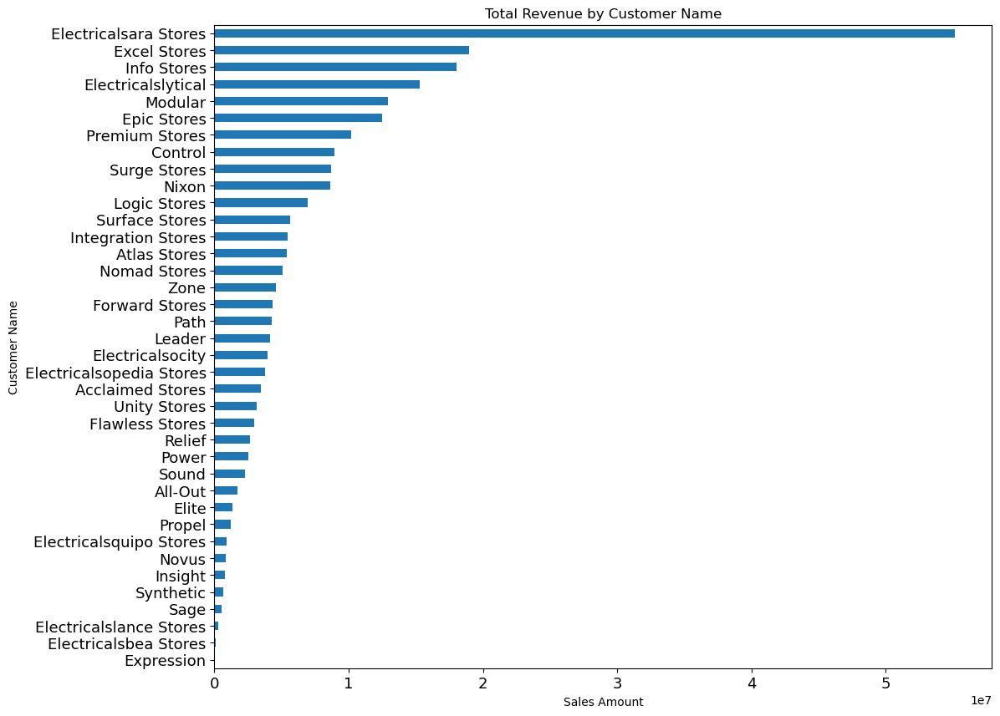

In [98]:
total_sales_by_customer_name =sales.groupby("customer_name")["sales_amount"].sum().sort_values(ascending=True)
total_sales_by_customer_name.plot(kind="barh",figsize=(12,10),fontsize=13)
plt.xlabel("Sales Amount")
plt.ylabel("Customer Name")
plt.title("Total Revenue by Customer Name")
plt.show()

### Sales Qty by Customers Name

In [99]:
total_sales_qty_by_customer_name = sales.groupby("customer_name").sales_qty.sum().sort_values(ascending=True)
total_sales_qty_by_customer_name

customer_name
Electricalsbea Stores         303.0
Expression                    325.0
Sage                          985.0
Electricalslance Stores      1576.0
Flawless Stores              1653.0
Synthetic                    2135.0
Elite                        2464.0
Path                         2773.0
Propel                       2799.0
Acclaimed Stores             2808.0
All-Out                      3227.0
Novus                        3277.0
Logic Stores                 3659.0
Electricalsocity             4252.0
Unity Stores                 8470.0
Zone                         8495.0
Leader                       8609.0
Nomad Stores                 8675.0
Relief                       8972.0
Power                        8976.0
Forward Stores              11414.0
Nixon                       14092.0
Atlas Stores                15043.0
Electricalsquipo Stores     15796.0
Integration Stores          16463.0
Electricalsopedia Stores    16925.0
Electricalslytical          18819.0
Sound         

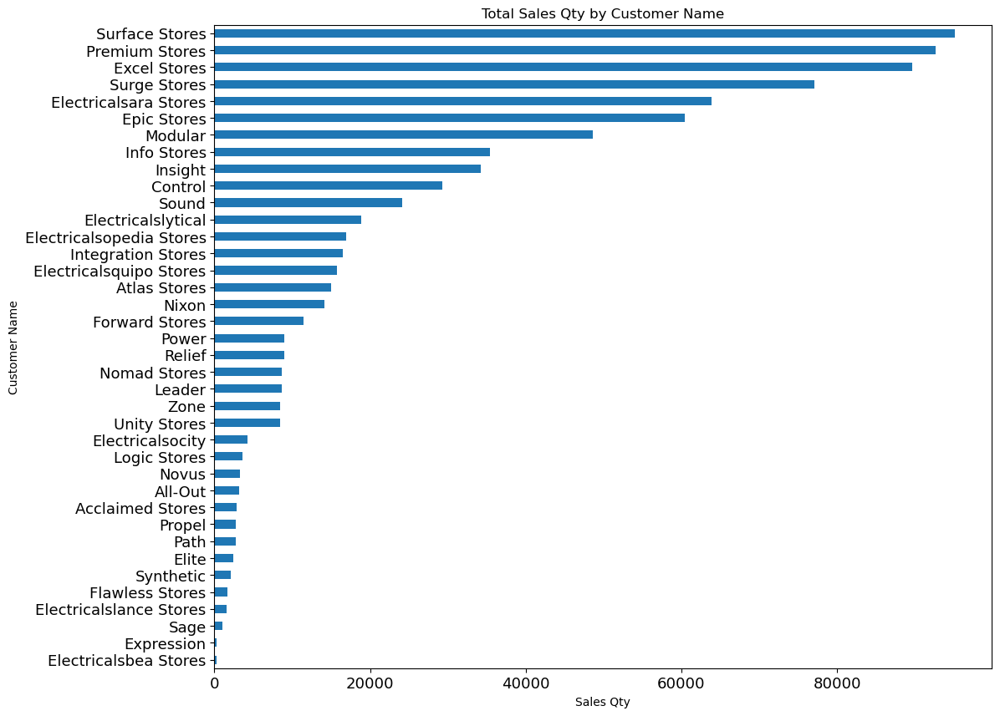

In [100]:
total_sales_qty_by_customer_name.plot(kind="barh",figsize=(12,10),fontsize=13)
plt.xlabel("Sales Qty")
plt.ylabel("Customer Name")
plt.title("Total Sales Qty by Customer Name")
plt.show()

### Total Sales Amount by Year , Customers Name

In [101]:
sales_amount_by_year_customer_name =sales.groupby(["year","customer_name"]).sales_amount.sum().unstack(fill_value=0)
sales_amount_by_year_customer_name

customer_name,Acclaimed Stores,All-Out,Atlas Stores,Control,Electricalsara Stores,Electricalsbea Stores,Electricalslance Stores,Electricalslytical,Electricalsocity,Electricalsopedia Stores,...,Premium Stores,Propel,Relief,Sage,Sound,Surface Stores,Surge Stores,Synthetic,Unity Stores,Zone
year,,,,,,,,,,,,,,,,,,,,,
2017.0,30630.0,124534.0,535946.0,682245.0,5220010.0,3960.0,32285.0,950322.0,1676.0,431995.0,...,1865506.0,52755.0,102645.0,14370.0,245710.0,564062.0,1466505.0,364398.0,193742.0,357996.0
2018.0,1550417.0,761845.0,1878119.0,3217891.0,24768524.0,68399.0,176402.0,6545867.0,2321360.0,1581406.0,...,4883249.0,529558.0,1123420.0,234192.0,840102.0,2092414.0,3203474.0,182185.0,1175767.0,1667539.0
2019.0,1372971.0,745528.0,2067103.0,3610588.0,12950731.0,31010.0,56644.0,6325761.0,884181.0,1345846.0,...,2562457.0,472923.0,1087289.0,197514.0,798176.0,2001925.0,2362063.0,111211.0,1208195.0,1737958.0
2020.0,515889.0,112123.0,919590.0,1424127.0,12211192.0,23075.0,22594.0,1463637.0,782869.0,437318.0,...,875099.0,162070.0,359279.0,68440.0,392781.0,957844.0,1663251.0,17478.0,558845.0,818046.0


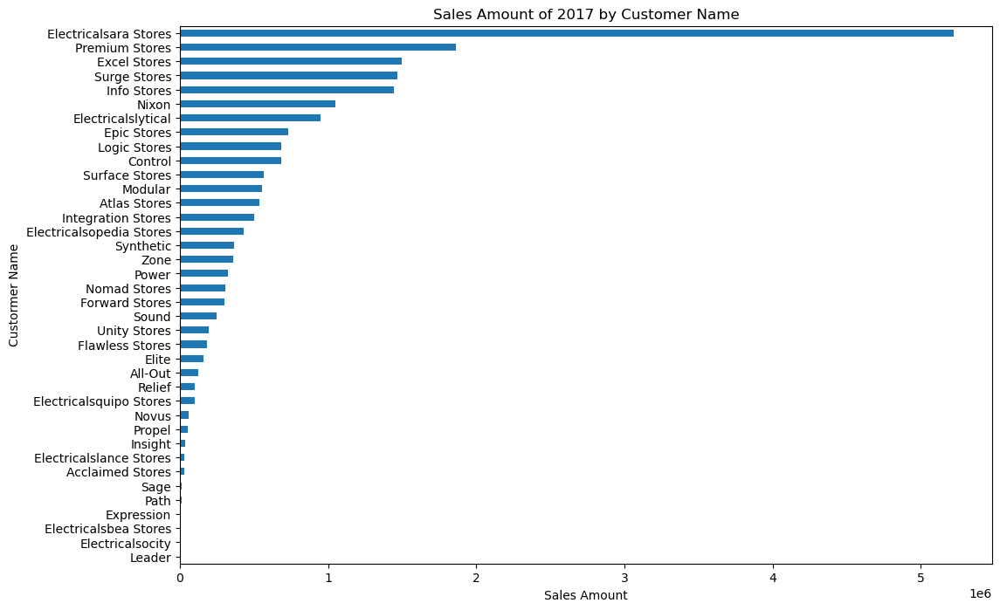

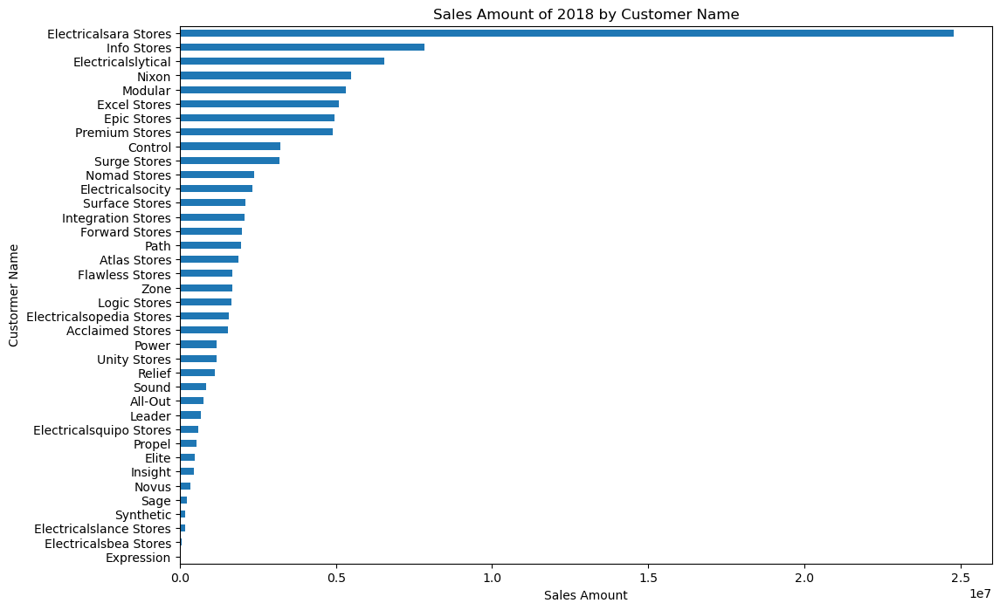

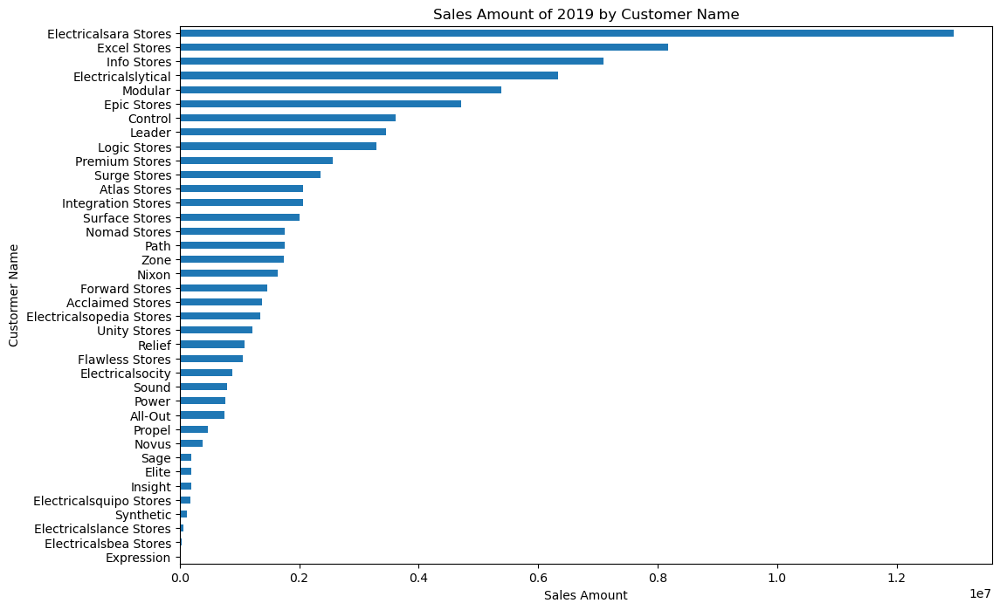

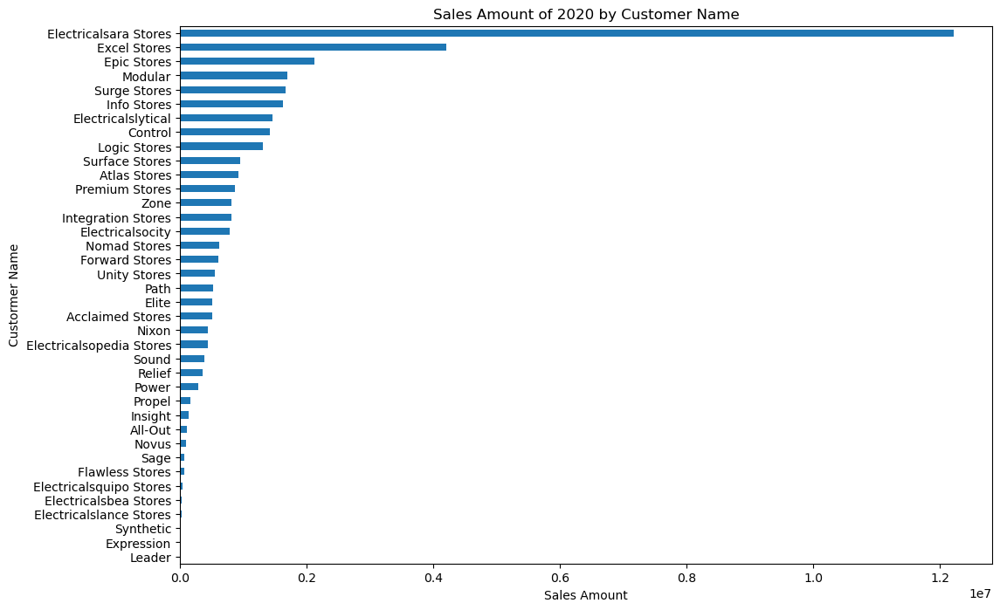

In [102]:
for i in sales_amount_by_year_customer_name.index:
        sales_amount_by_year_customer_name.loc[i].sort_values(ascending=True).plot(kind="barh",figsize=(12,8))
        plt.title(f"Sales Amount of {int(i)} by Customer Name")
        plt.ylabel("Custormer Name")
        plt.xlabel("Sales Amount")
        plt.show()

### Total Sales Qty by year , Customer Name

In [103]:
sales_qty_by_year_customer_name =sales.groupby(["year","customer_name"]).sales_qty.sum().unstack(fill_value=0)
sales_qty_by_year_customer_name

customer_name,Acclaimed Stores,All-Out,Atlas Stores,Control,Electricalsara Stores,Electricalsbea Stores,Electricalslance Stores,Electricalslytical,Electricalsocity,Electricalsopedia Stores,...,Premium Stores,Propel,Relief,Sage,Sound,Surface Stores,Surge Stores,Synthetic,Unity Stores,Zone
year,,,,,,,,,,,,,,,,,,,,,
2017.0,64.0,288.0,1242.0,1455.0,12090.0,11.0,198.0,1230.0,10.0,1909.0,...,19661.0,150.0,522.0,80.0,1580.0,8211.0,10053.0,658.0,564.0,659.0
2018.0,1353.0,1359.0,5115.0,11089.0,33604.0,132.0,1015.0,6862.0,2091.0,7127.0,...,49100.0,1209.0,3343.0,421.0,7580.0,37060.0,21101.0,568.0,3023.0,2953.0
2019.0,1005.0,1342.0,5912.0,12284.0,8945.0,92.0,259.0,9589.0,1075.0,5779.0,...,23052.0,1086.0,3702.0,340.0,8282.0,32568.0,36701.0,760.0,3340.0,3118.0
2020.0,386.0,238.0,2774.0,4489.0,9281.0,68.0,104.0,1138.0,1076.0,2110.0,...,870.0,354.0,1405.0,144.0,6738.0,17311.0,9258.0,149.0,1543.0,1765.0


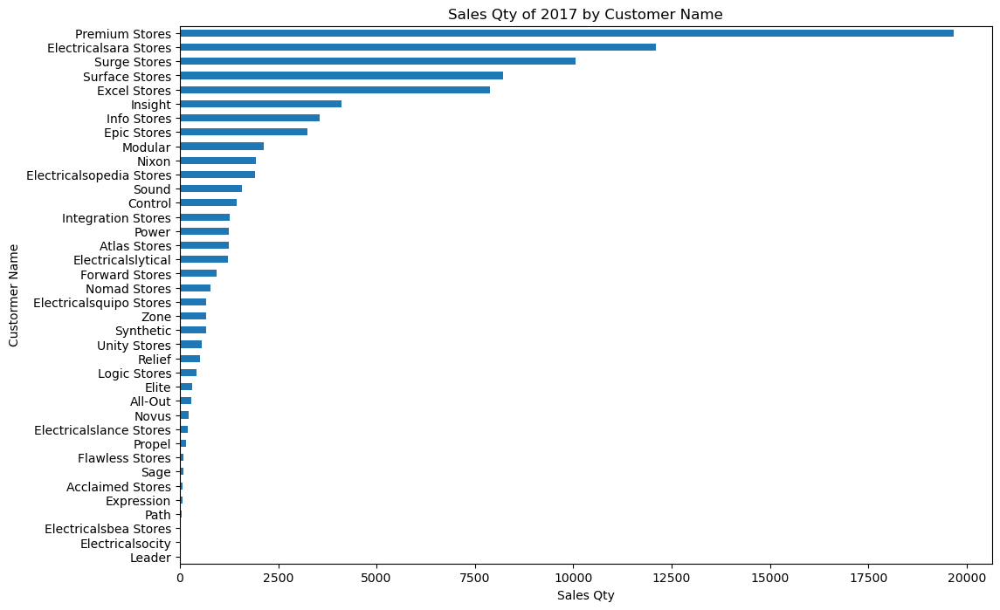

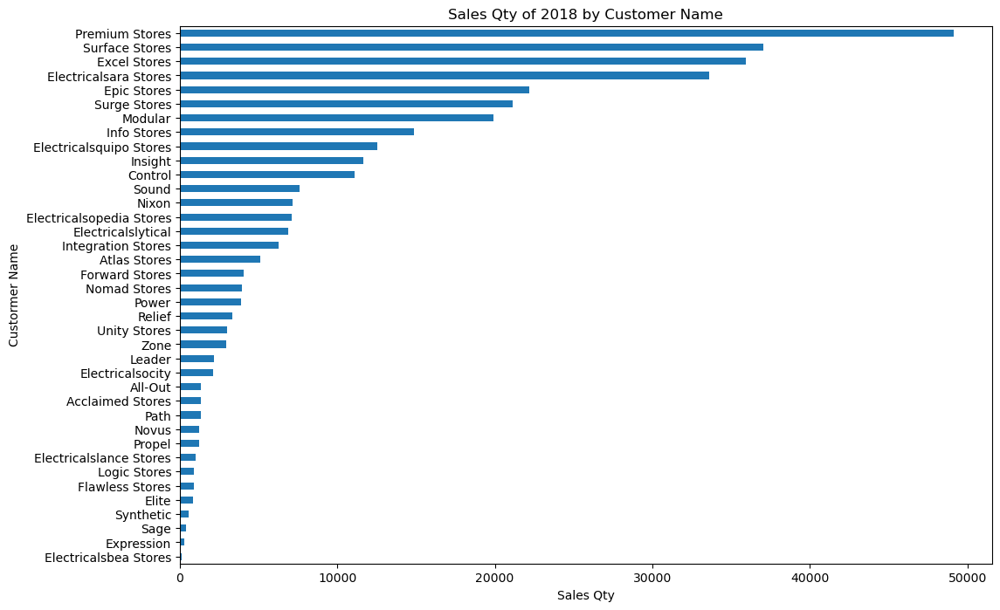

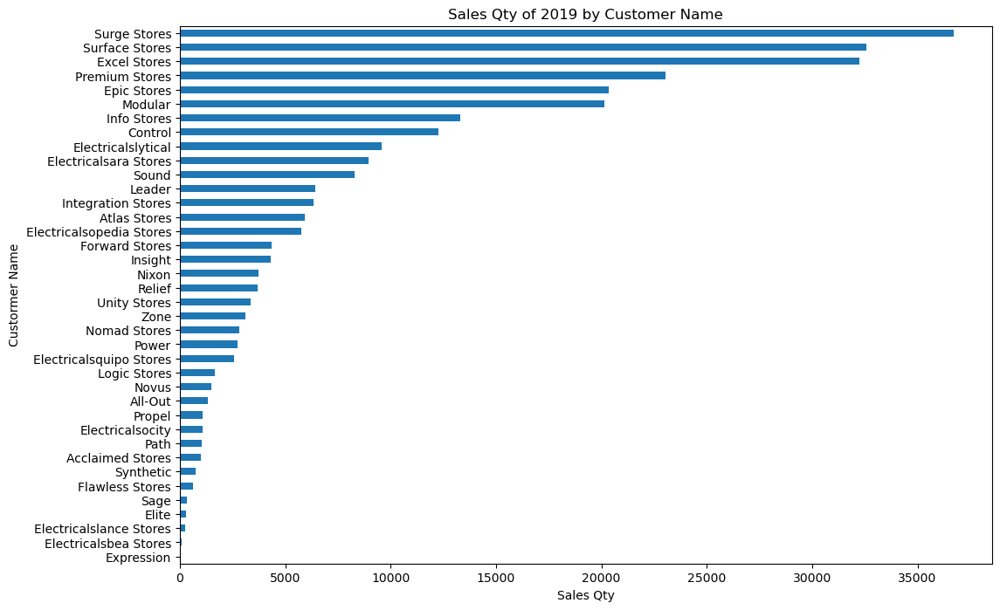

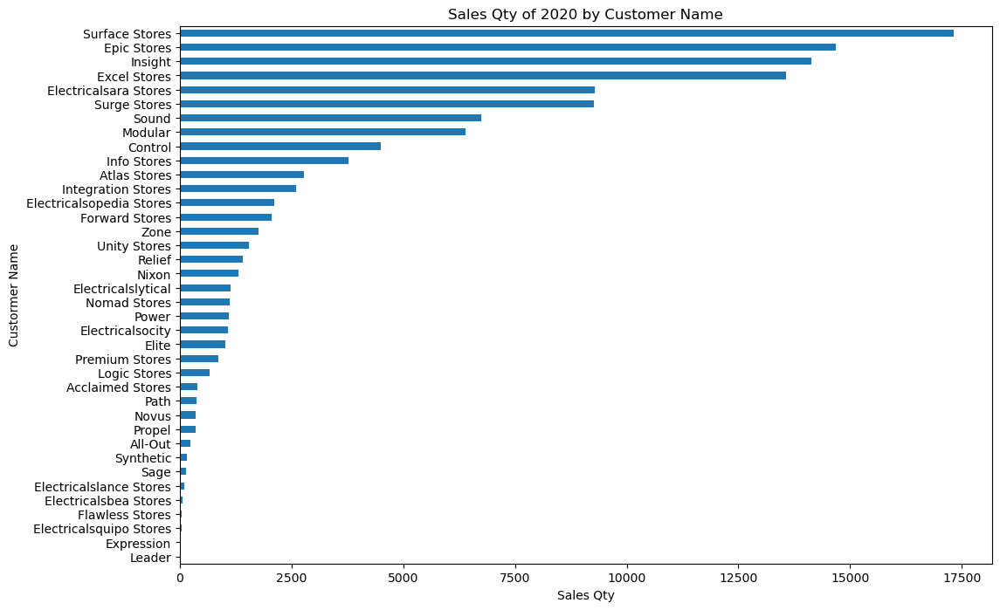

In [104]:
for i in sales_qty_by_year_customer_name.index:
        sales_qty_by_year_customer_name.loc[i].sort_values(ascending=True).plot(kind="barh",figsize=(12,8))
        plt.title(f"Sales Qty of {int(i)} by Customer Name")
        plt.ylabel("Custormer Name")
        plt.xlabel("Sales Qty")
        plt.show()

### Total Sales Amount by Year , Month , Customers Name

In [105]:
sales_amount_by_year_month_customer_name = sales.groupby(["year","month_name","customer_name"]).sales_amount.sum().unstack(fill_value=0)
sales_amount_by_year_month_customer_name

customer_name      Acclaimed Stores   All-Out  Atlas Stores   Control  \
year   month_name                                                       
2017.0 December              3356.0   79913.0      131889.0  181833.0   
       November              2445.0   18760.0      143580.0  252911.0   
       October              24829.0   25861.0      260477.0  247501.0   
2018.0 April                    0.0   25885.0      177585.0  150146.0   
       August                4939.0   53945.0      177421.0  256471.0   
       December             22866.0   68393.0      121213.0  325787.0   
       February            912238.0   16122.0      121648.0  220276.0   
       January             411421.0   24233.0      163093.0  134865.0   
       July                  2176.0   47696.0      160891.0  279370.0   
       June                  1185.0   45442.0      124205.0  180137.0   
       March               137102.0  255321.0      168065.0  738522.0   
       May                  23412.0   36723.0      216531.0  202542.0   
       November             10856.0   68861.0      184759.0  235582.0   
       October               1356.0   70432.0      151955.0  269765.0   
       September            22866.0   48792.0      110753.0  224428.0   
2019.0 April                68329.0   34297.0      172432.0  291705.0   
       August              191241.0   62251.0      213703.0  349048.0   
       December            136658.0   15088.0      141936.0  277338.0   
       February            147584.0   42057.0      126936.0  241537.0   
       January              41574.0   62505.0      162548.0  324114.0   
       July                116973.0  171610.0      201578.0  306475.0   
       June                107320.0   48370.0      263292.0  353690.0   
       March                83148.0   83598.0      163812.0  320469.0   
       May                 191236.0   37361.0      158184.0  328912.0   
       November            181588.0    8788.0      172549.0  273276.0   
       October                  0.0   57061.0      149176.0  265733.0   
       September           107320.0  122542.0      140957.0  278291.0   
2020.0 April               113259.0   23143.0      222600.0  309241.0   
       February            265815.0   16102.0      128312.0  240749.0   
       January              68329.0   10139.0      175014.0  209968.0   
       June                     0.0   13796.0       76230.0  170372.0   
       March                68486.0   27879.0      165416.0  315371.0   
       May                      0.0   21064.0      152018.0  178426.0   

customer_name      Electricalsara Stores  Electricalsbea Stores  \
year   month_name                                                 
2017.0 December                2093098.0                 3960.0   
       November                1922158.0                    0.0   
       October                 1204754.0                    0.0   
2018.0 April                   2284191.0                 2713.0   
       August                  1308253.0                 9043.0   
       December                 946979.0                 2037.0   
       February                1711792.0                 3283.0   
       January                 8401190.0                 2829.0   
       July                    1596834.0                 7644.0   
       June                    1473293.0                 5247.0   
       March                   2071032.0                 2264.0   
       May                     2022038.0                24287.0   
       November                 985140.0                 2038.0   
       October                  522023.0                 2940.0   
       September               1445759.0                 4074.0   
2019.0 April                   1122980.0                 3172.0   
       August                   594687.0                 4297.0   
       December                1303563.0                 1922.0   
       February                 713650.0                  903.0   
       January                  78400

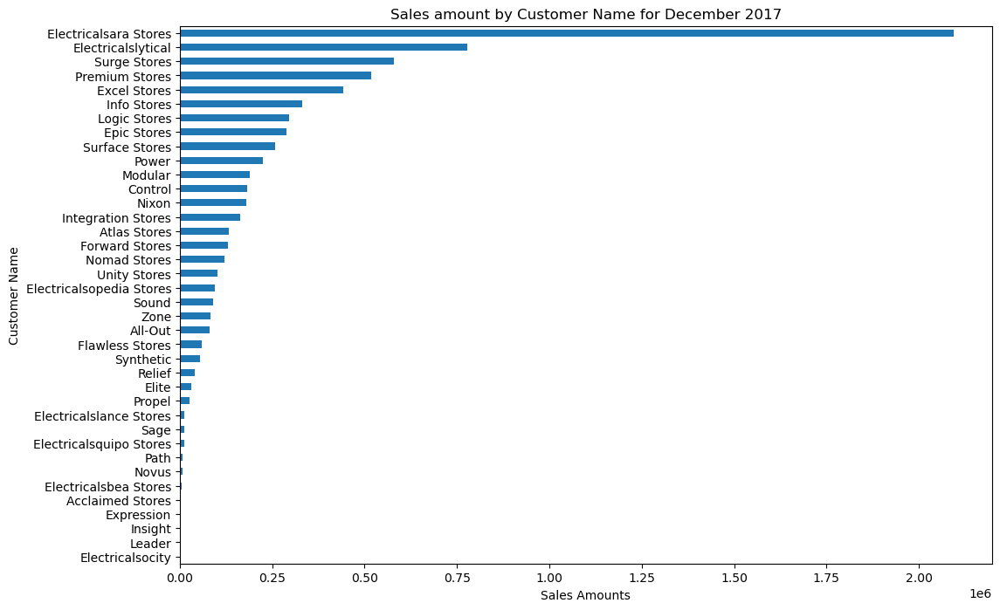

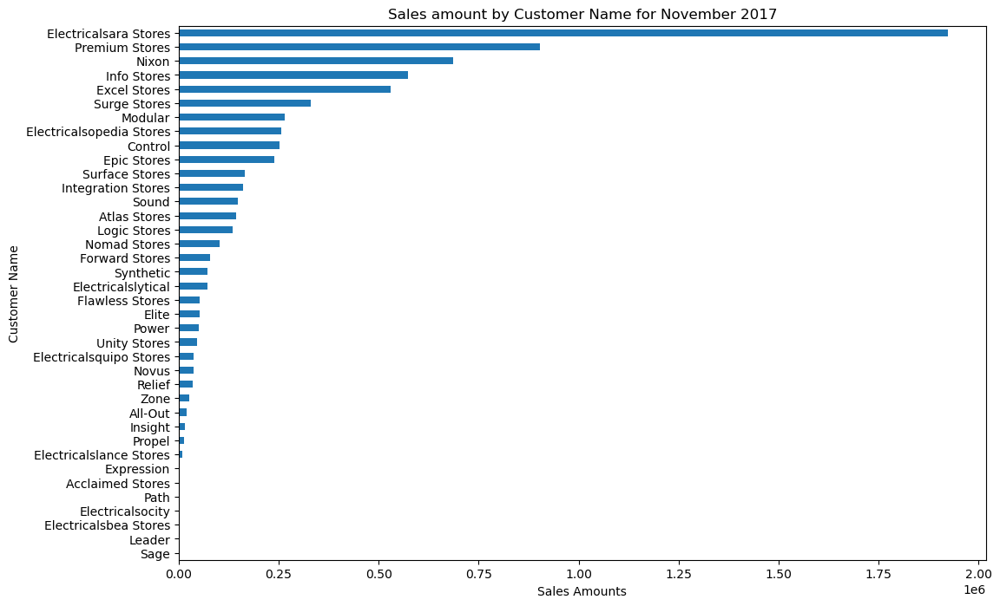

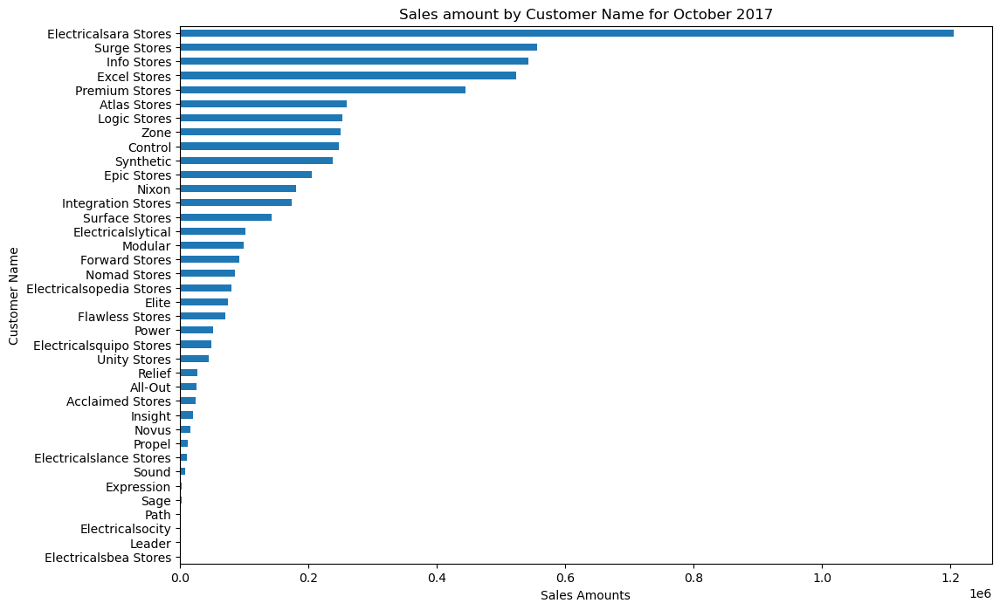

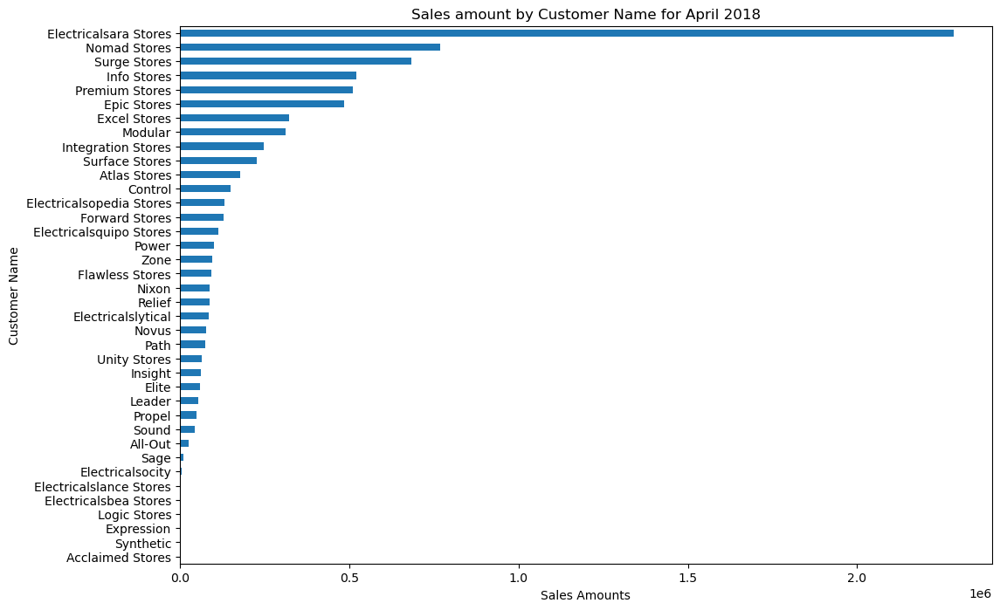

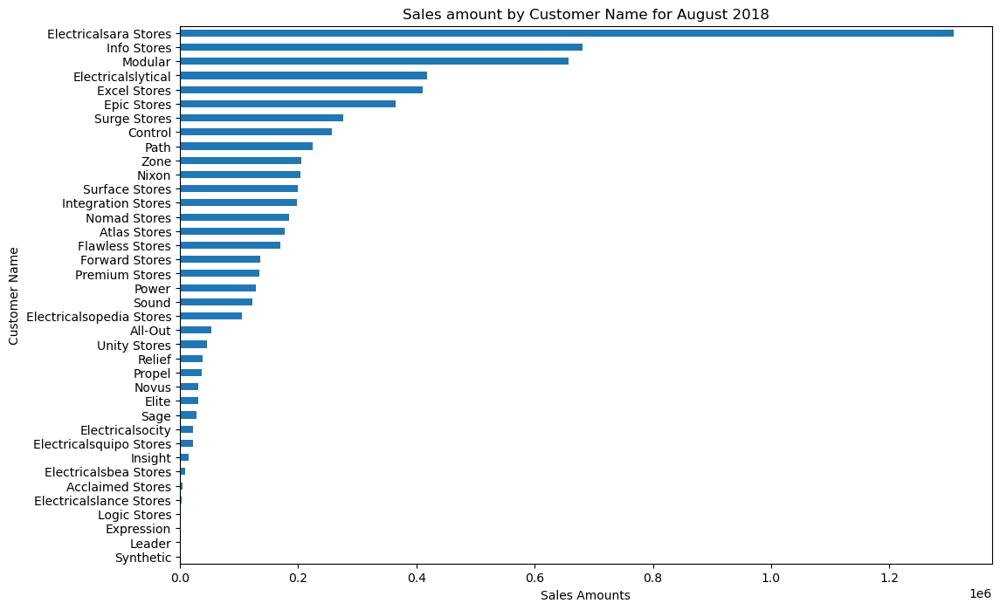

...

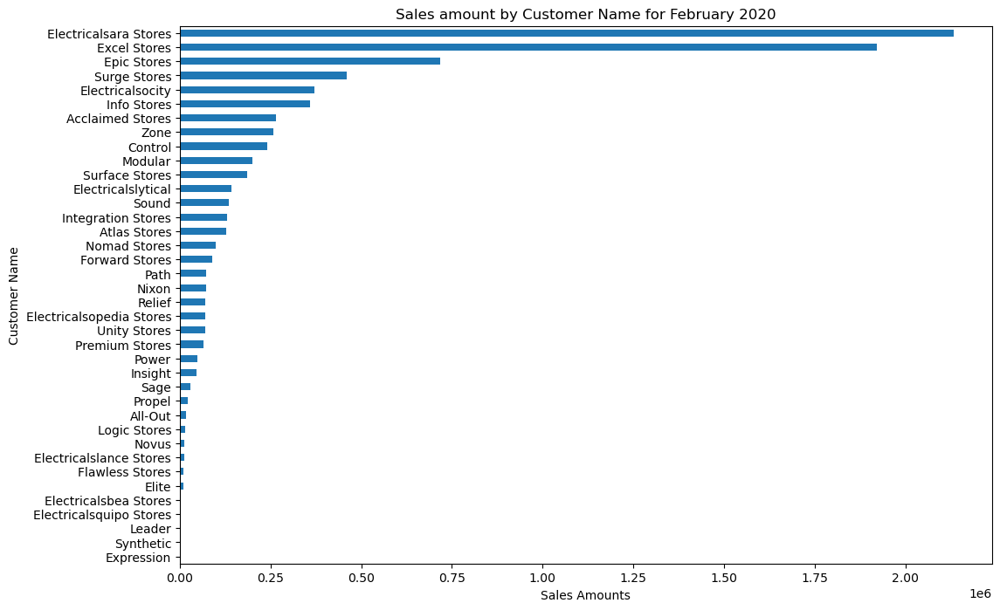

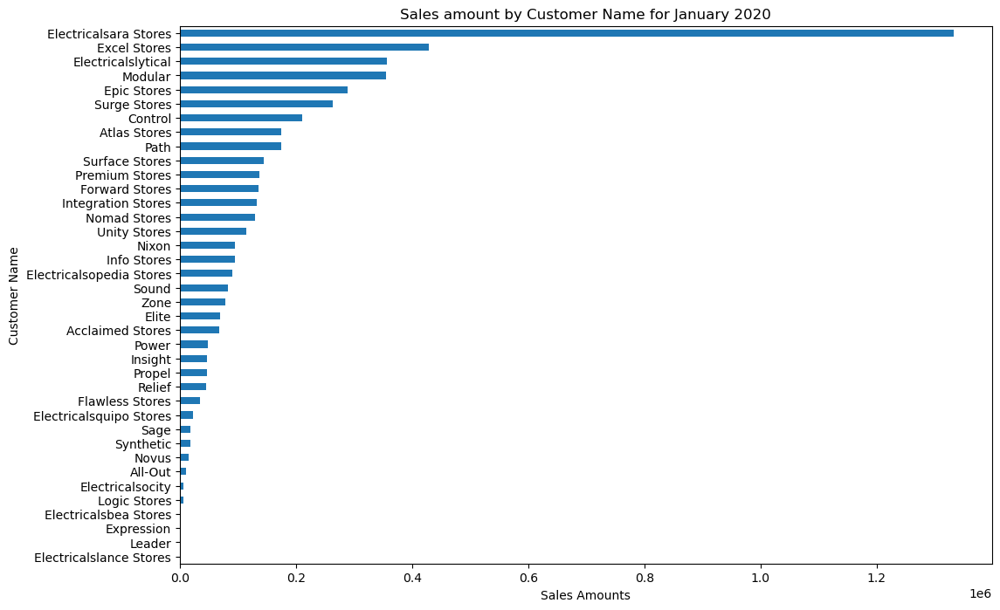

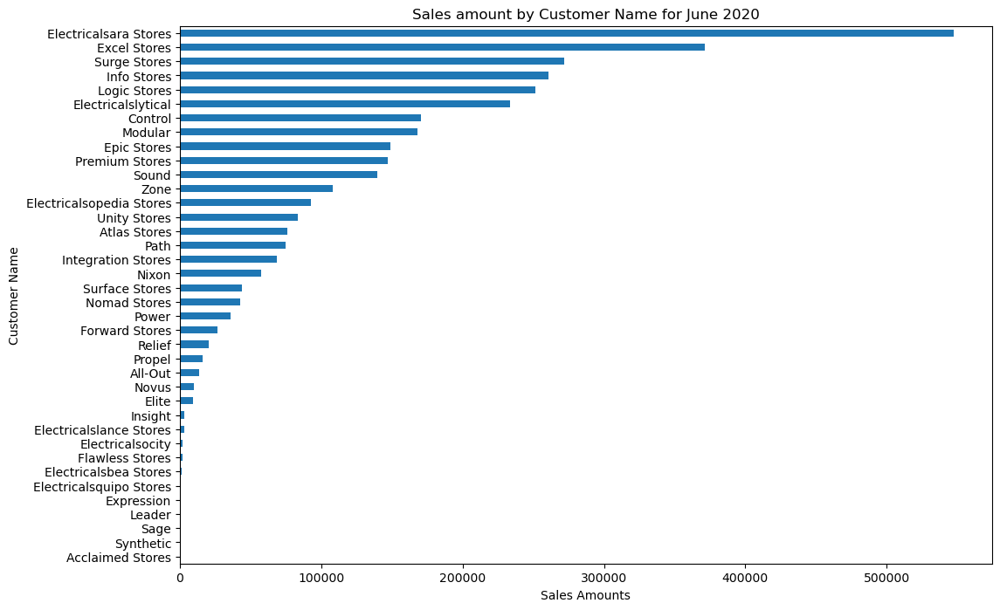

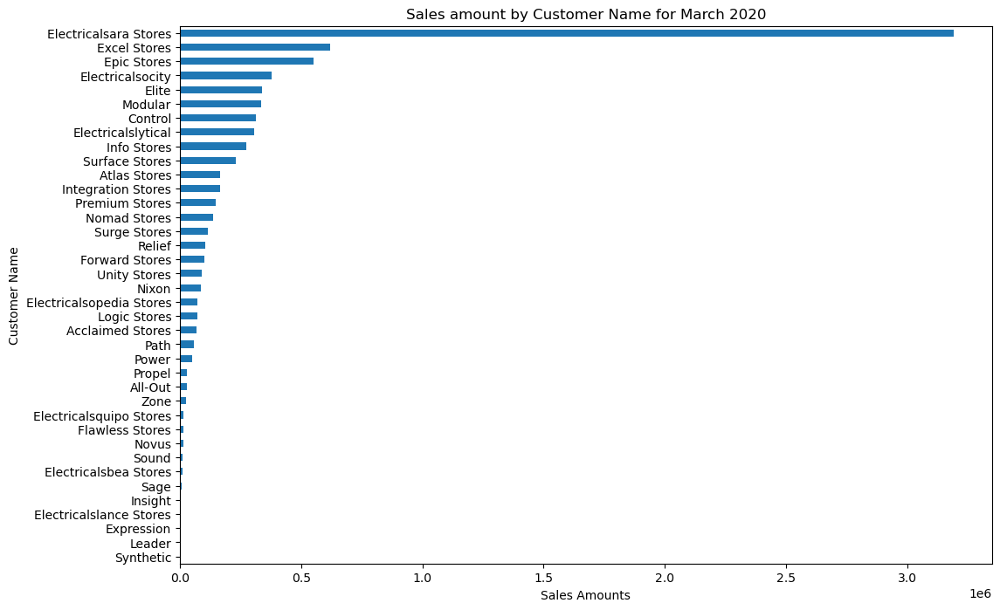

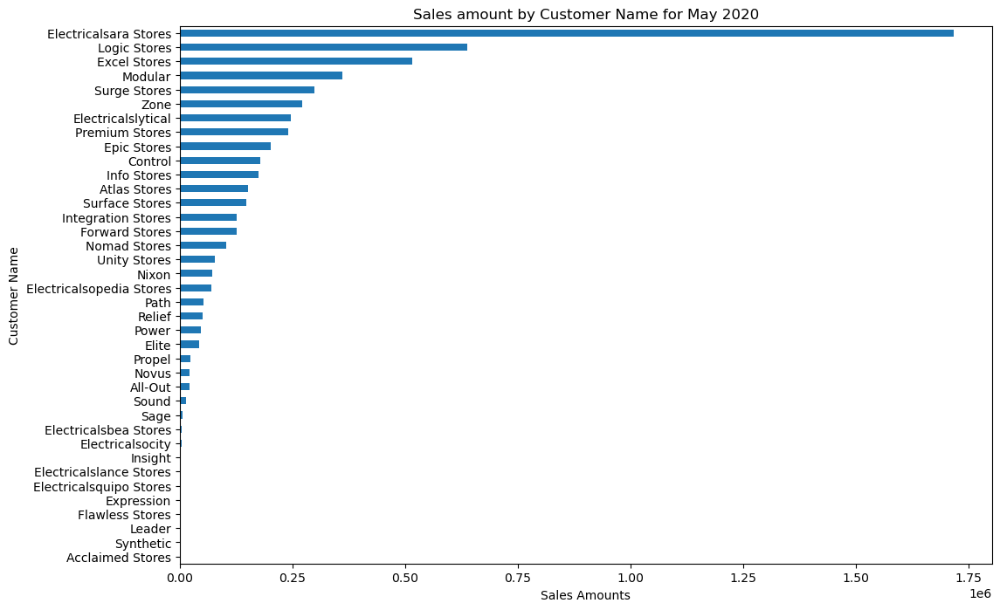

In [106]:
for i in sales_amount_by_year_month_customer_name.index:
    
    sales_amount_by_year_month_customer_name.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
    plt.title(f"Sales amount by Customer Name for {i[1]} {int(i[0])}")
    plt.xlabel("Sales Amounts")
    plt.ylabel("Customer Name")
    plt.show()
    

### Total Sales Qty by Year , Month , Customer Name

In [107]:
sales_qty_by_year_month_customer_name = sales.groupby(["year","month_name","customer_name"]).sales_qty.sum().unstack(fill_value=0)
sales_qty_by_year_month_customer_name

customer_name      Acclaimed Stores  All-Out  Atlas Stores  Control  \
year   month_name                                                     
2017.0 December                11.0    185.0         356.0    567.0   
       November                 9.0     39.0         371.0    775.0   
       October                 44.0     64.0         515.0    113.0   
2018.0 April                    0.0     62.0         518.0    503.0   
       August                  25.0    113.0         435.0   1051.0   
       December                36.0    136.0         324.0   1001.0   
       February               769.0     33.0         336.0    713.0   
       January                242.0     50.0         436.0    499.0   
       July                     9.0     87.0         393.0   1025.0   
       June                     5.0    106.0         334.0    689.0   
       March                  133.0    334.0         473.0   2108.0   
       May                     38.0     73.0         697.0    877.0   
       November                53.0    132.0         509.0    765.0   
       October                  7.0    126.0         396.0    944.0   
       September               36.0    107.0         264.0    914.0   
2019.0 April                   40.0     65.0         492.0   1079.0   
       August                 153.0    134.0         622.0   1199.0   
       December                80.0     24.0         405.0    769.0   
       February               126.0     71.0         374.0    801.0   
       January                 30.0    128.0         456.0   1126.0   
       July                    90.0    235.0         615.0   1190.0   
       June                    70.0     88.0         659.0   1141.0   
       March                   60.0    180.0         507.0   1098.0   
       May                    153.0     52.0         435.0   1207.0   
       November               133.0      9.0         503.0    923.0   
       October                  0.0    132.0         444.0    826.0   
       September               70.0    224.0         400.0    925.0   
2020.0 April                   93.0     68.0         707.0    965.0   
       February               213.0     26.0         403.0    720.0   
       January                 40.0     10.0         477.0    643.0   
       June                     0.0     33.0         228.0    480.0   
       March                   40.0     59.0         511.0   1043.0   
       May                      0.0     42.0         448.0    638.0   

customer_name      Electricalsara Stores  Electricalsbea Stores  \
year   month_name                                                 
2017.0 December                   4342.0                   11.0   
       November                   4753.0                    0.0   
       October                    2995.0                    0.0   
2018.0 April                      3888.0                    8.0   
       August                     1273.0                   15.0   
       December                   1140.0                    6.0   
       February                   3288.0                   10.0   
       January                    7585.0                    8.0   
       July                       1527.0                   18.0   
       June                       2619.0                    8.0   
       March                      4602.0                    7.0   
       May                        4232.0                   25.0   
       November                   1311.0                    6.0   
       October                     883.0                    9.0   
       September                  1256.0                   12.0   
2019.0 April                       700.0                    9.0   
       August                      421.0                   13.0   
       December                    733.0                    6.0   
       February                    827.0                    3.0   
       January                     947.0                    6.0   
       July                       1080.0

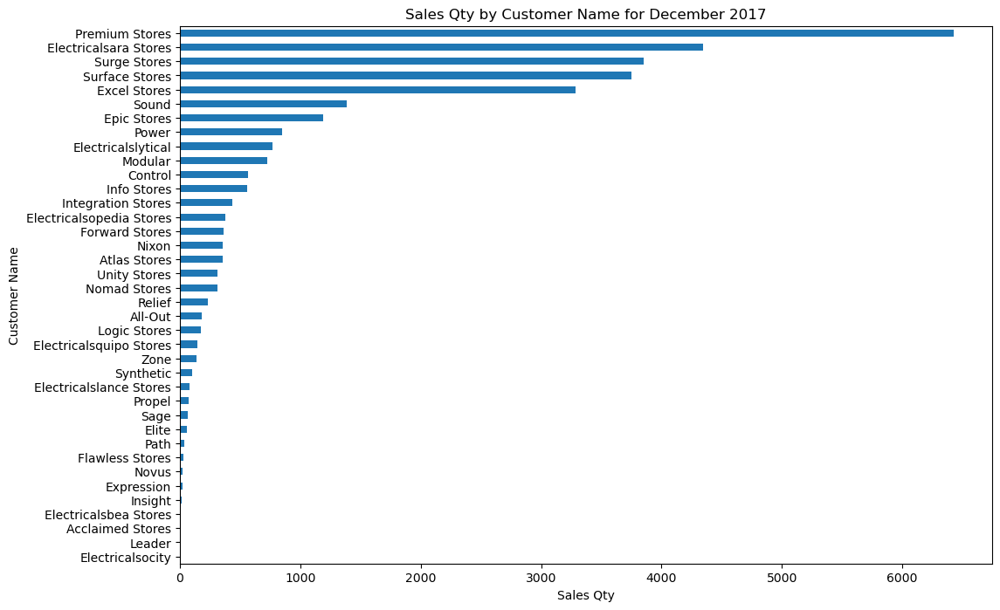

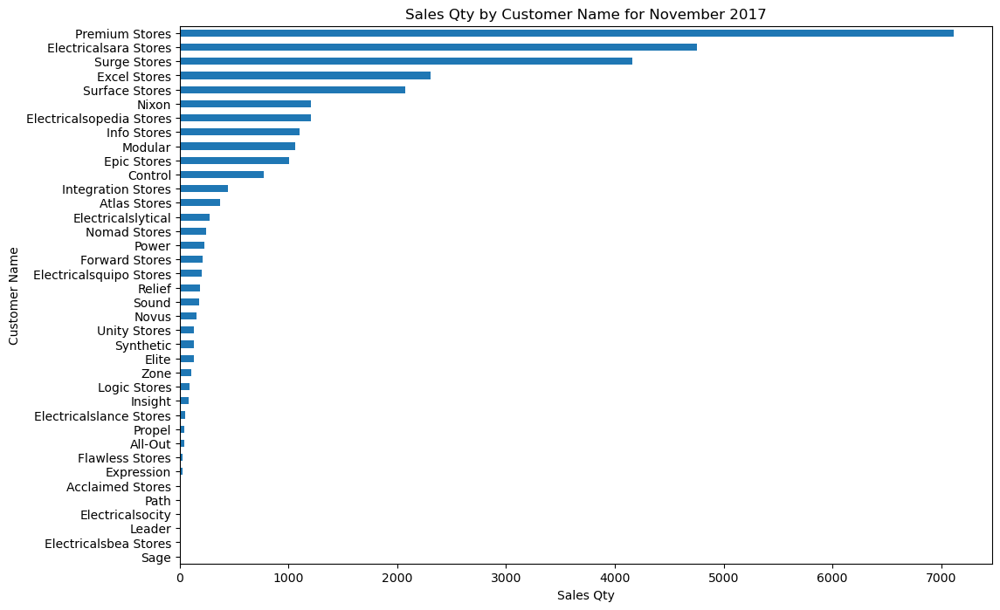

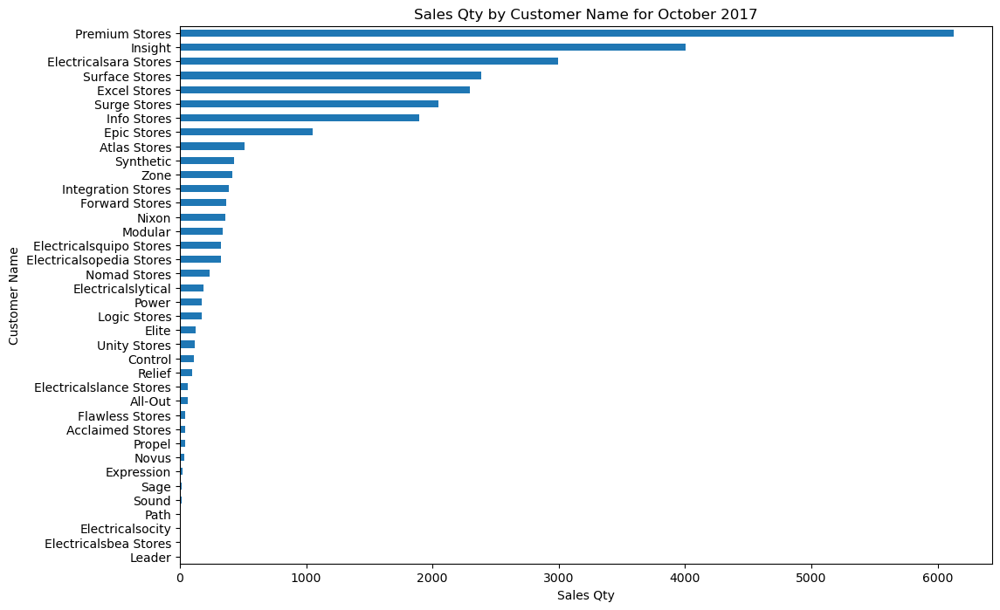

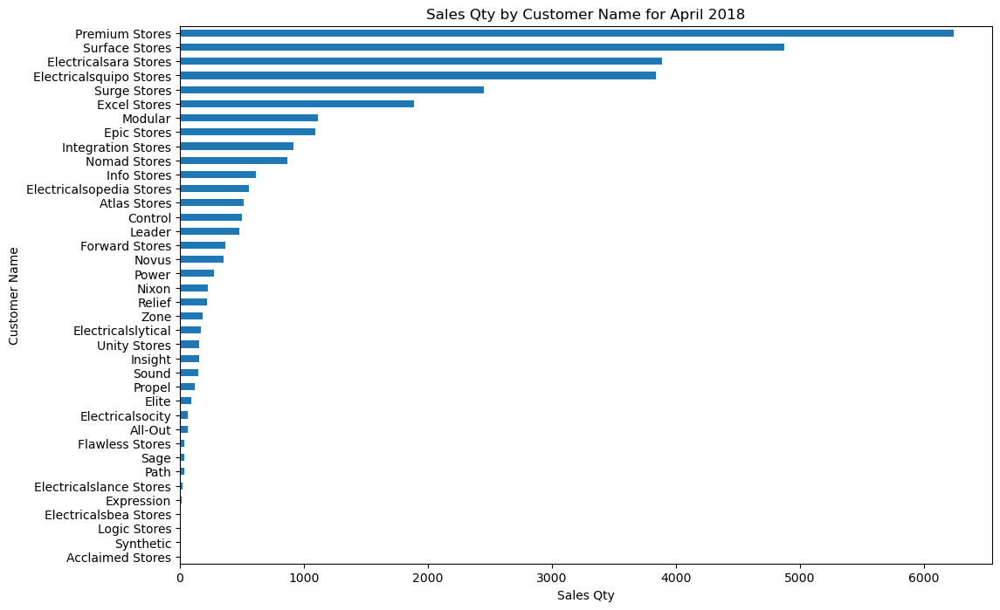

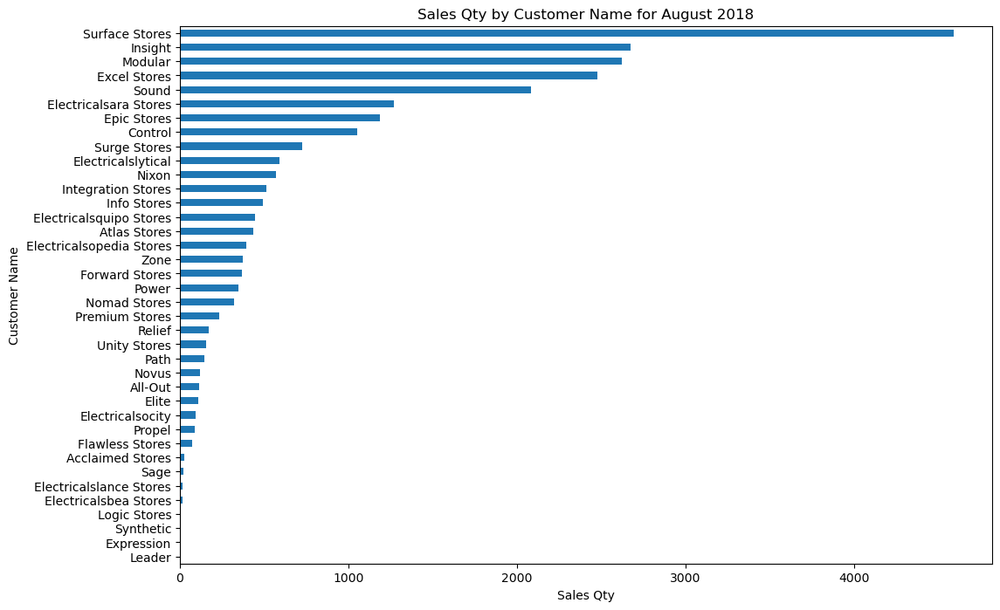

...

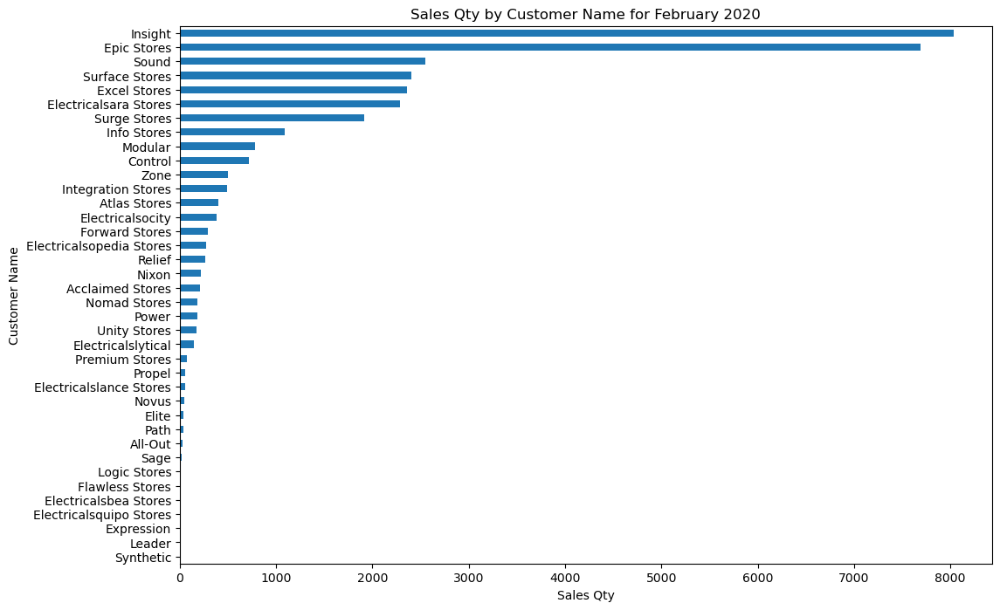

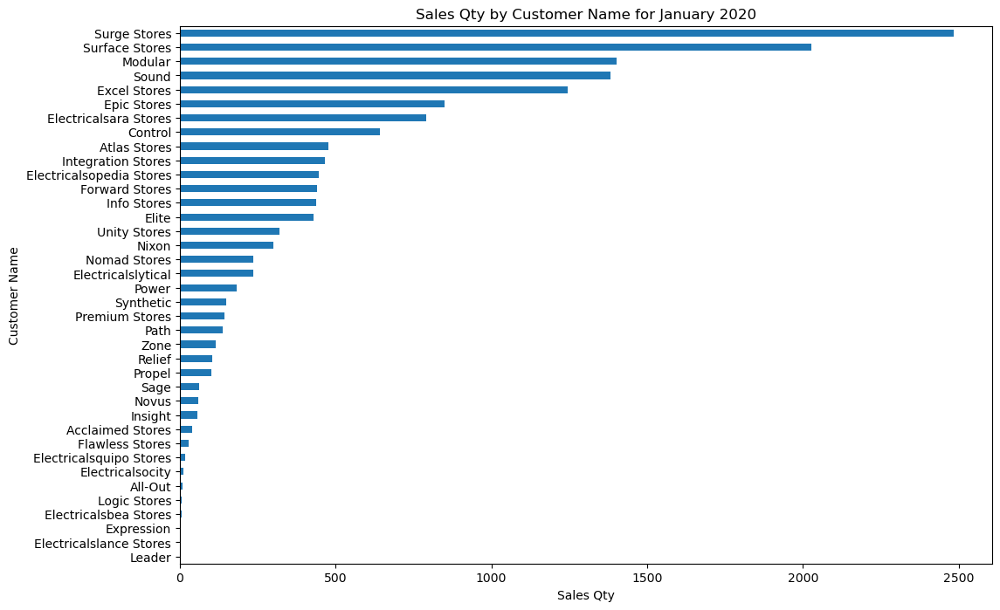

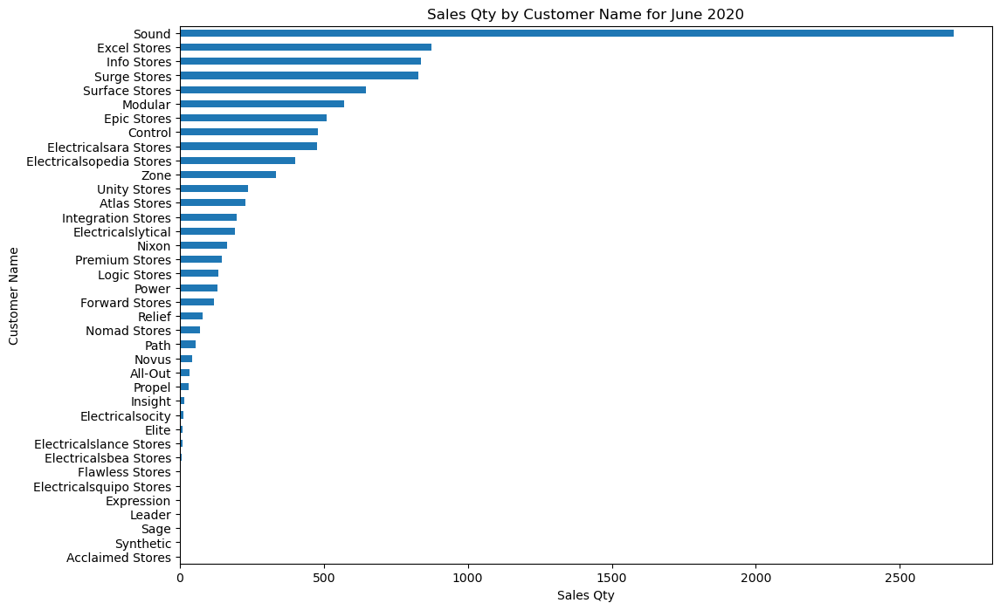

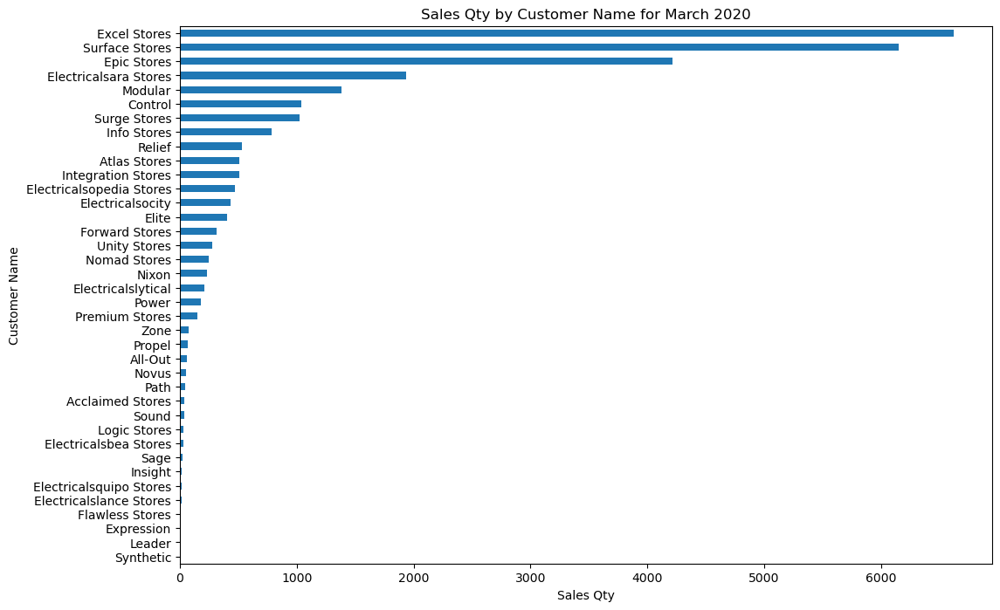

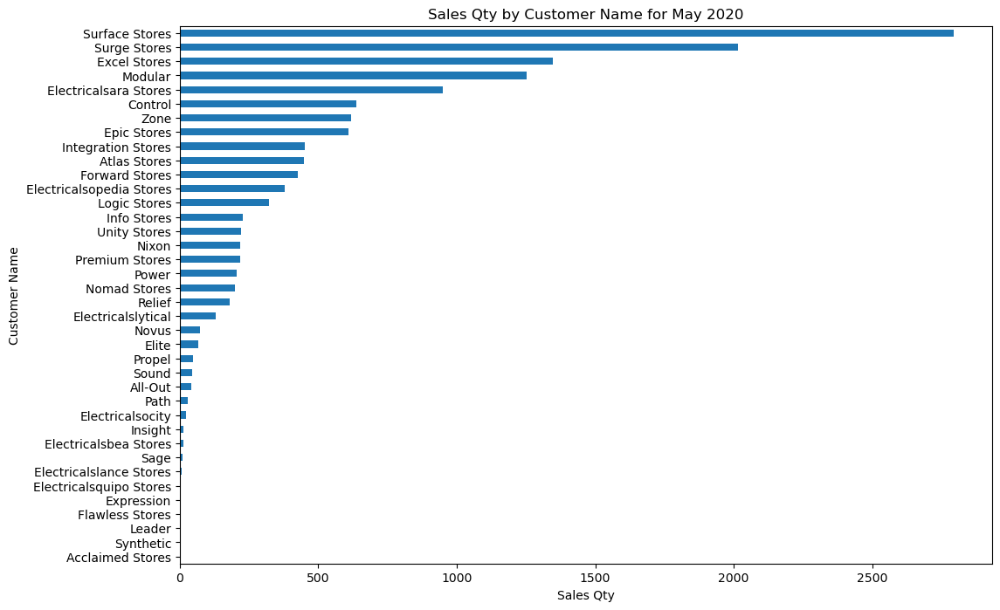

In [108]:
for i in sales_qty_by_year_month_customer_name.index:
    
    sales_qty_by_year_month_customer_name.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
    plt.title(f"Sales Qty by Customer Name for {i[1]} {int(i[0])}")
    plt.xlabel("Sales Qty")
    plt.ylabel("Customer Name")
    plt.show()

### Total Sales Amount by Market

In [109]:
market_grp = sales.groupby("markets_name")

In [110]:
sales.head()

,product_code,sales_qty,sales_amount,currency,product_price,markets_name,zone,customer_name,customer_type,product_type,cy_date,year,month_name,date_yy_mmm
0,Prod001,100.0,41241.0,INR,412.410000,Chennai,South,Surge Stores,Brick & Mortar,Own Brand,2017-10-01,2017.0,October,17-Oct
1,Prod002,1.0,875.0,INR,875.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
2,Prod002,1.0,583.0,INR,583.000000,Ahmedabad,North,Excel Stores,Brick & Mortar,Own Brand,2018-04-01,2018.0,April,18-Apr
3,Prod002,6.0,7176.0,INR,1196.000000,Ahmedabad,North,Surface Stores,Brick & Mortar,Own Brand,2018-06-01,2018.0,June,18-Jun
4,Prod003,59.0,37500.0,INR,8.474576,Delhi NCR,North,Premium Stores,Brick & Mortar,Own Brand,2017-11-01,2017.0,November,17-Nov


### Total  Sales Amount by Market

In [111]:
sales_amount_by_market =  market_grp.sales_amount.sum().sort_values()
sales_amount_by_market

markets_name
Bhubaneshwar      291978.0
Bengaluru         314032.0
Lucknow           695280.0
Patna            1170425.0
Surat            1384637.0
Kanpur           2656959.0
Hyderabad        3689364.0
Chennai          4851308.0
Kochi            7846649.0
Bhopal          20414745.0
Nagpur          35543430.0
Ahmedabad       38718905.0
Mumbai          46673310.0
Delhi NCR       84251278.0
Name: sales_amount, dtype: float64

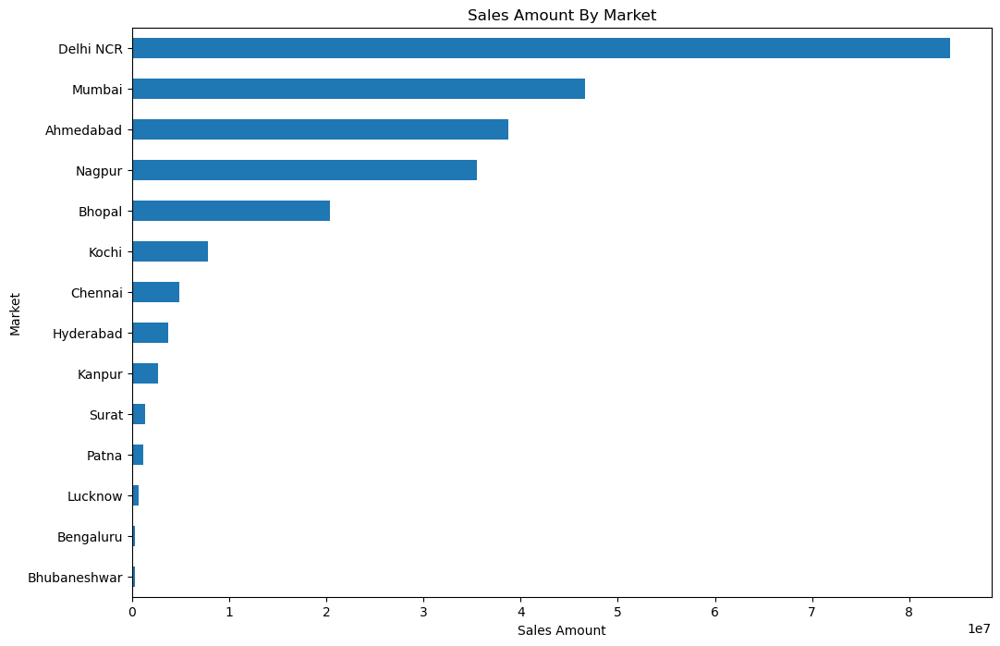

In [112]:
sales_amount_by_market.plot(kind="barh",figsize=(12,8))
plt.title("Sales Amount By Market")
plt.xlabel("Sales Amount")
plt.ylabel("Market")
plt.show()

### Total Sales Qty by Market

In [113]:
sales_qty_by_market = market_grp.sales_qty.sum().sort_values()
sales_qty_by_market

markets_name
Bengaluru          208.0
Patna             1736.0
Kanpur            2710.0
Bhubaneshwar      6509.0
Chennai          10085.0
Surat            10744.0
Lucknow          33709.0
Bhopal           47475.0
Hyderabad        57667.0
Ahmedabad       105680.0
Delhi NCR       108686.0
Mumbai          137098.0
Kochi           159340.0
Nagpur          161962.0
Name: sales_qty, dtype: float64

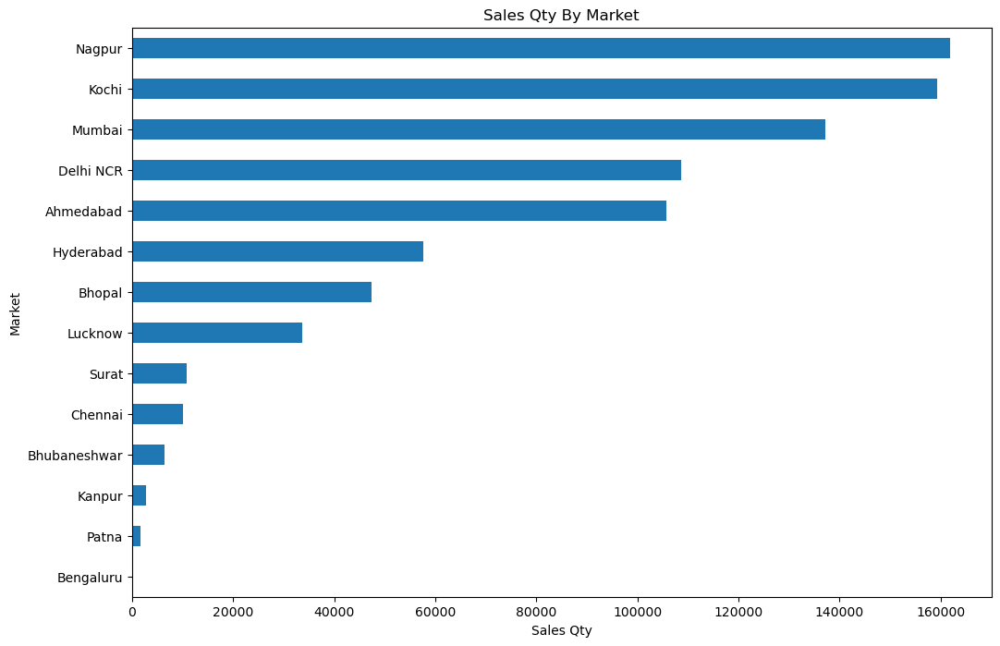

In [114]:
sales_qty_by_market.plot(kind="barh",figsize=(12,8))
plt.title("Sales Qty By Market")
plt.xlabel("Sales Qty")
plt.ylabel("Market")
plt.show()

### Grouped by Year

In [115]:
year_grp=sales.groupby("year")

### Total Sales Amount by Year , Market

In [116]:
year_market_grp = sales.groupby(["year","markets_name"]).sales_amount.sum().unstack(fill_value=0)
year_market_grp

markets_name,Ahmedabad,Bengaluru,Bhopal,Bhubaneshwar,Chennai,Delhi NCR,Hyderabad,Kanpur,Kochi,Lucknow,Mumbai,Nagpur,Patna,Surat
year,,,,,,,,,,,,,,
2017.0,3410955.0,0.0,1166865.0,26315.0,837971.0,8576679.0,578172.0,70470.0,1084218.0,32278.0,2750678.0,2465112.0,153750.0,44142.0
2018.0,14205994.0,314032.0,7074318.0,10685.0,2100055.0,39386079.0,1723664.0,1138369.0,2777270.0,422308.0,17990486.0,14685585.0,471869.0,648316.0
2019.0,14851450.0,0.0,9795694.0,165515.0,741089.0,21779113.0,1042281.0,1005193.0,2877616.0,132249.0,19048173.0,13277053.0,185732.0,547906.0
2020.0,6250506.0,0.0,2377868.0,89463.0,1172193.0,14509407.0,345247.0,442927.0,1107545.0,108445.0,6883973.0,5115680.0,359074.0,144273.0


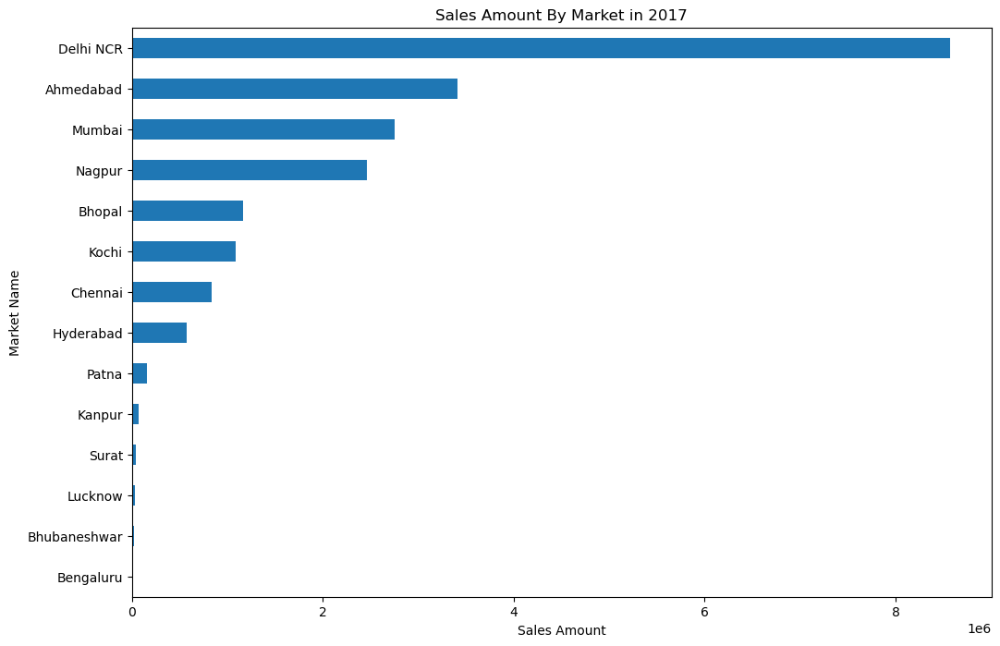

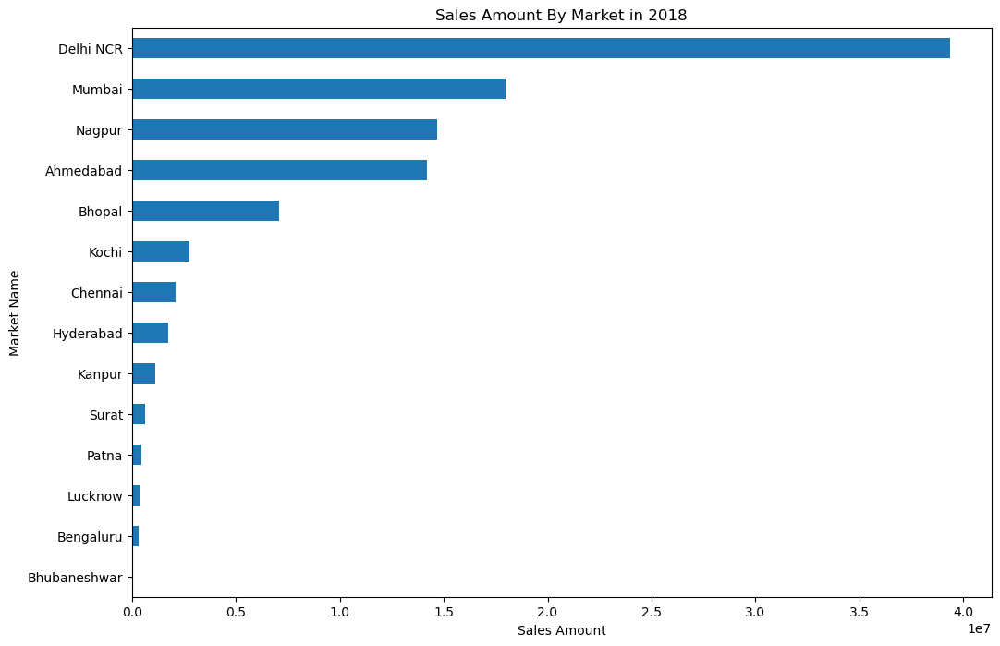

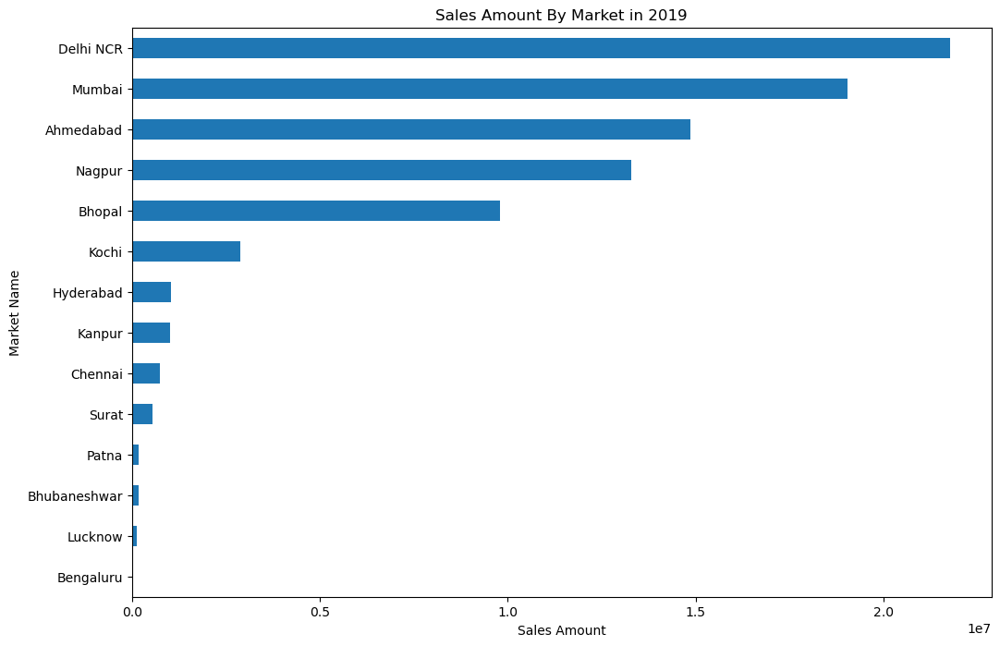

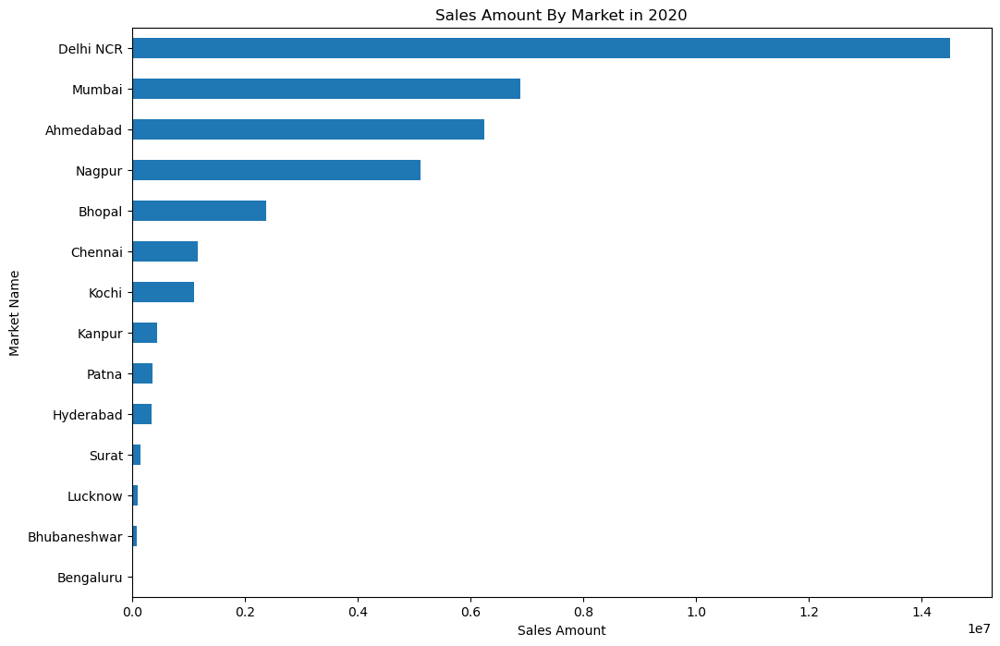

In [117]:
for i in year_market_grp.index:
    year_market_grp.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
    plt.title(f"Sales Amount By Market in {int(i)}")
    plt.xlabel("Sales Amount")
    plt.ylabel("Market Name")
    plt.show()
  
    

### Total Sales Qty by Year , Market

In [118]:
year_market_qty_grp = sales.groupby(["year","markets_name"]).sales_qty.sum().unstack(fill_value=0)
year_market_qty_grp

markets_name,Ahmedabad,Bengaluru,Bhopal,Bhubaneshwar,Chennai,Delhi NCR,Hyderabad,Kanpur,Kochi,Lucknow,Mumbai,Nagpur,Patna,Surat
year,,,,,,,,,,,,,,
2017.0,8269.0,0.0,3597.0,71.0,1529.0,20237.0,5440.0,198.0,16553.0,4073.0,20072.0,8895.0,306.0,324.0
2018.0,37637.0,208.0,17041.0,102.0,4148.0,57172.0,25931.0,1245.0,53248.0,11539.0,64816.0,67214.0,824.0,4825.0
2019.0,41270.0,0.0,20971.0,4004.0,1782.0,20062.0,19390.0,924.0,66183.0,4067.0,40830.0,59461.0,245.0,4481.0
2020.0,18504.0,0.0,5866.0,2332.0,2626.0,11215.0,6906.0,343.0,23356.0,14030.0,11380.0,26392.0,361.0,1114.0


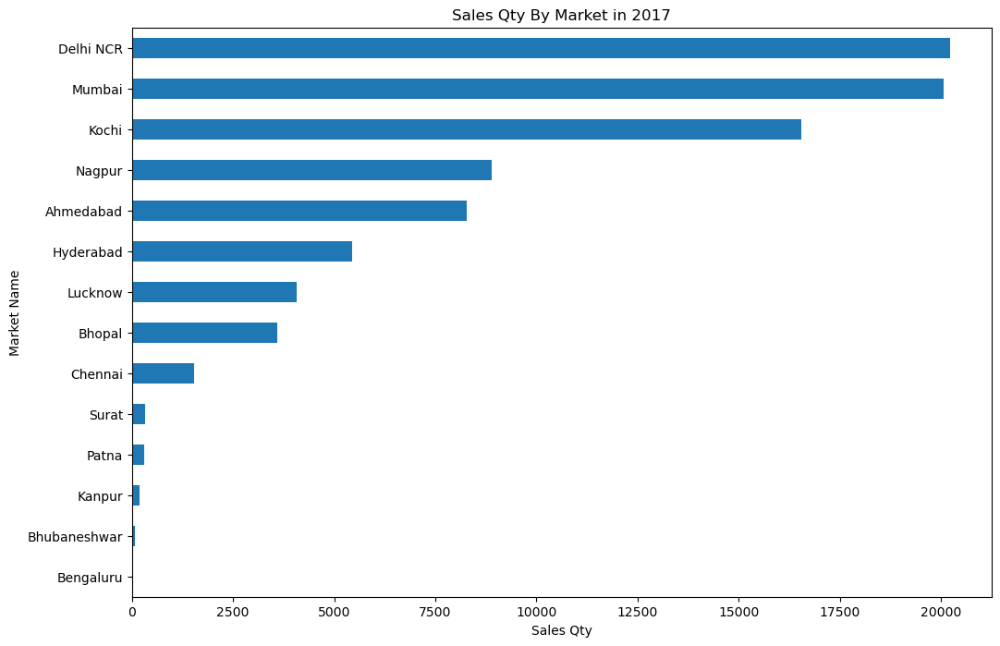

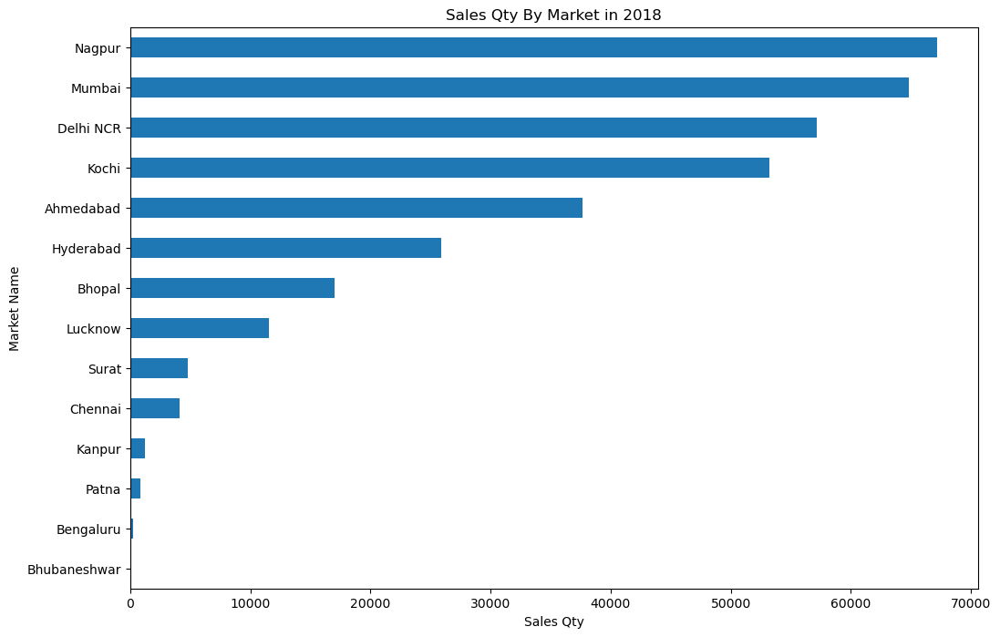

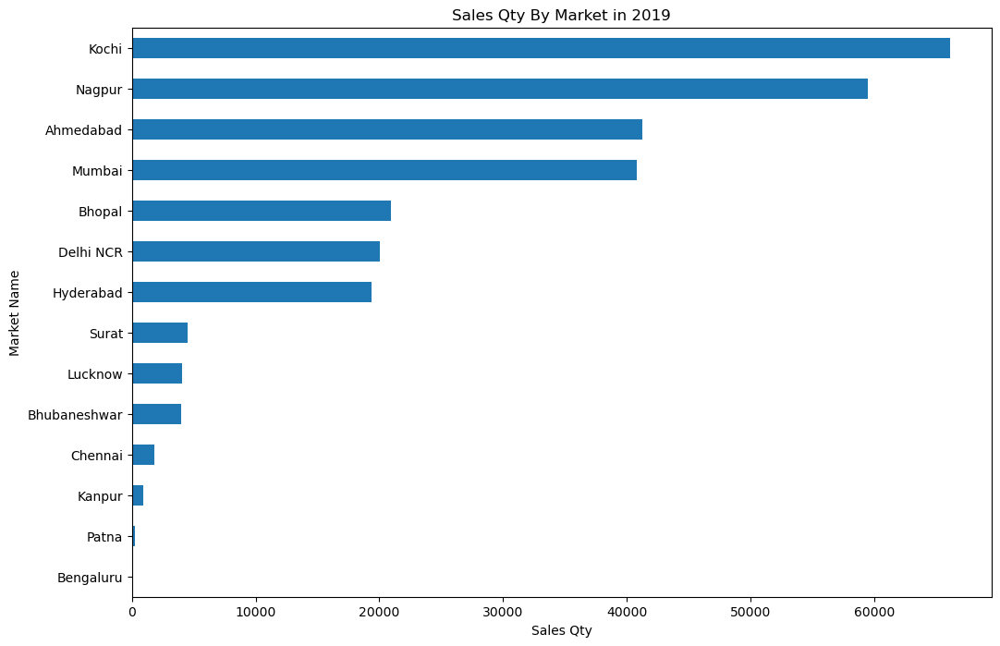

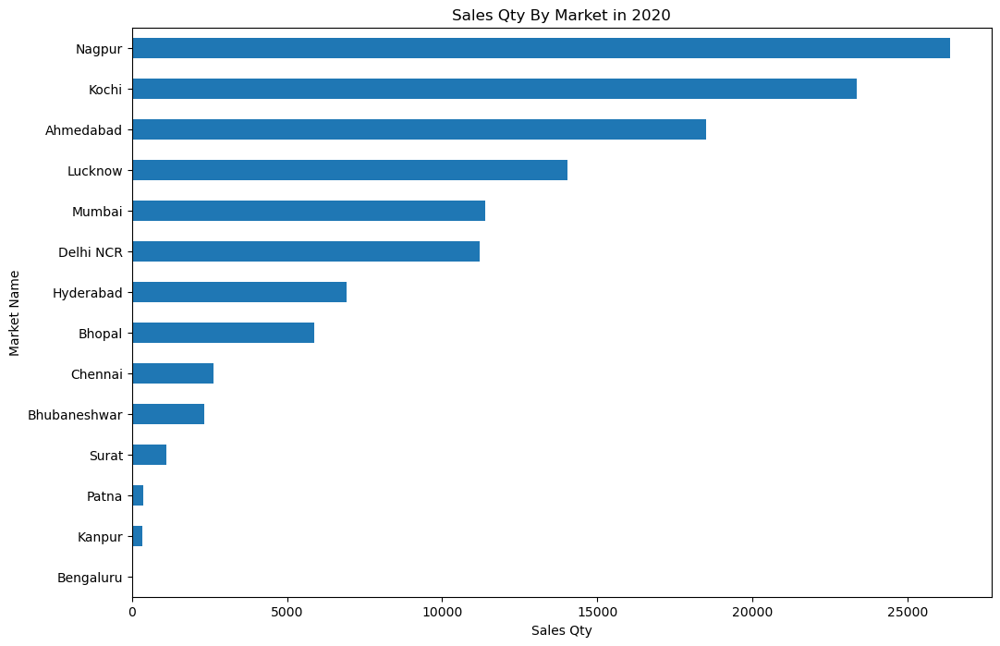

In [119]:
for i in year_market_qty_grp.index:
    year_market_qty_grp.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
    plt.title(f"Sales Qty By Market in {int(i)}")
    plt.xlabel("Sales Qty")
    plt.ylabel("Market Name")
    plt.show()

### Total Sales Amount by Year , Month , Market

In [120]:
amount_year_month_market_grp = sales.groupby(["year","month_name","markets_name"]).sales_amount.sum().unstack(fill_value=0)
amount_year_month_market_grp

markets_name       Ahmedabad  Bengaluru     Bhopal  Bhubaneshwar   Chennai  \
year   month_name                                                            
2017.0 December    1009189.0        0.0   341823.0        8139.0  343705.0   
       November    1137153.0        0.0   352163.0       10963.0   77667.0   
       October     1264613.0        0.0   472879.0        7213.0  416599.0   
2018.0 April       1129384.0     3611.0   732623.0          97.0  555003.0   
       August      1241810.0        0.0   500750.0           0.0  262333.0   
       December     968943.0        0.0   494769.0           0.0   99125.0   
       February     907651.0        0.0   368307.0        1393.0   66315.0   
       January      997293.0        0.0   365490.0        7125.0  618101.0   
       July        1325939.0        0.0   773357.0           0.0   14560.0   
       June        1313137.0        0.0   602577.0           0.0  127610.0   
       March       1882687.0   307944.0   853182.0        1176.0    9191.0   
       May         1251468.0     2477.0   698020.0           0.0  132214.0   
       November    1228780.0        0.0   603867.0         894.0  103005.0   
       October      938664.0        0.0   425542.0           0.0   41950.0   
       September   1020238.0        0.0   655834.0           0.0   70648.0   
2019.0 April       1172741.0        0.0   902426.0           0.0    6681.0   
       August      1199192.0        0.0   991967.0        6389.0   66352.0   
       December    1178536.0        0.0   228427.0           0.0   54542.0   
       February     910684.0        0.0  1026236.0           0.0  106347.0   
       January     1151354.0        0.0  1198878.0       10477.0   31226.0   
       July        2082712.0        0.0   905455.0           0.0   26306.0   
       June        1365806.0        0.0   741687.0       19167.0  150694.0   
       March       1179353.0        0.0   723717.0       70278.0    9394.0   
       May         1369564.0        0.0  1093711.0       36144.0   50231.0   
       November    1057872.0        0.0   559370.0        8986.0   60260.0   
       October     1133355.0        0.0   517333.0        7685.0  174755.0   
       September   1050281.0        0.0   906487.0        6389.0    4301.0   
2020.0 April       1368448.0        0.0   369768.0           0.0  131431.0   
       February     947352.0        0.0   471035.0       31944.0  412654.0   
       January     1154496.0        0.0   501690.0       12796.0  168305.0   
       June         606719.0        0.0   173966.0       25556.0  224084.0   
       March       1269448.0        0.0   531061.0       19167.0   75292.0   
       May          904043.0        0.0   330348.0           0.0  160427.0   

markets_name       Delhi NCR  Hyderabad    Kanpur     Kochi   Lucknow  \
year   month_name                                                       
2017.0 December    2778505.0   231998.0   21385.0  450384.0       0.0   
       November    3716947.0   185229.0   12247.0  363848.0   11898.0   
       October     2081227.0   160945.0   36838.0  269986.0   20380.0   
2018.0 April       3065395.0    94944.0   15626.0  320567.0   62981.0   
       August      2142558.0    90936.0   18005.0  181135.0   12963.0   
       December    2978352.0   111690.0   48685.0   67059.0   19444.0   
       February    3553329.0   139028.0    7451.0  268178.0  102707.0   
       January     9223120.0   145371.0  421275.0  249511.0   17769.0   
       July        2350047.0    17790.0  160524.0   22356.0   14028.0   
       June        2890468.0   102276.0  104849.0  378243.0   62986.0   
       March       4408278.0   284748.0  242404.0  416293.0   84060.0   
       May         3146189.0   127428.0   35122.0  635547.0   25926.0   
       November    1957792.0   230476.0   35089.0  114449.0   19444.0   
       October     1543717.0   216963.0   13764.0   92273.0       0.0   
       September   2126834.0   162014.0   35575.0   31659.0       0.0   
2019.0 April       1640942.0

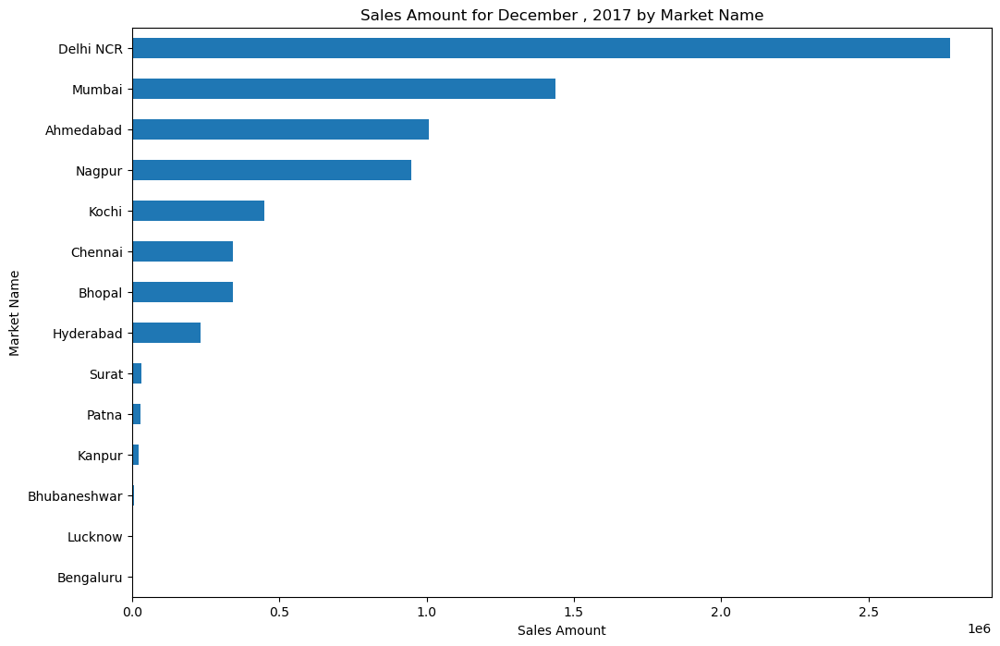

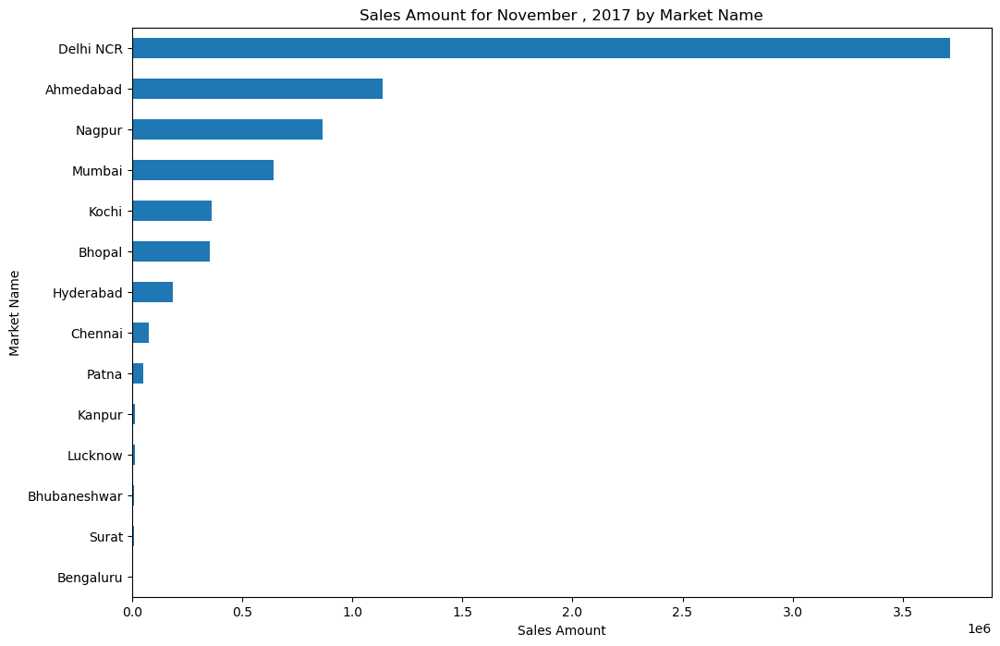

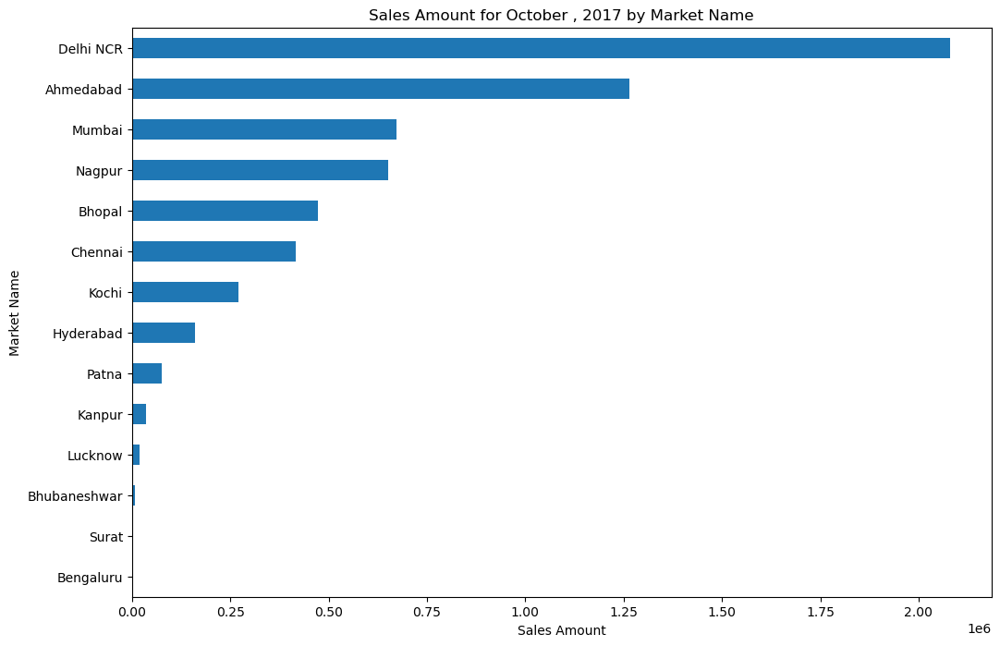

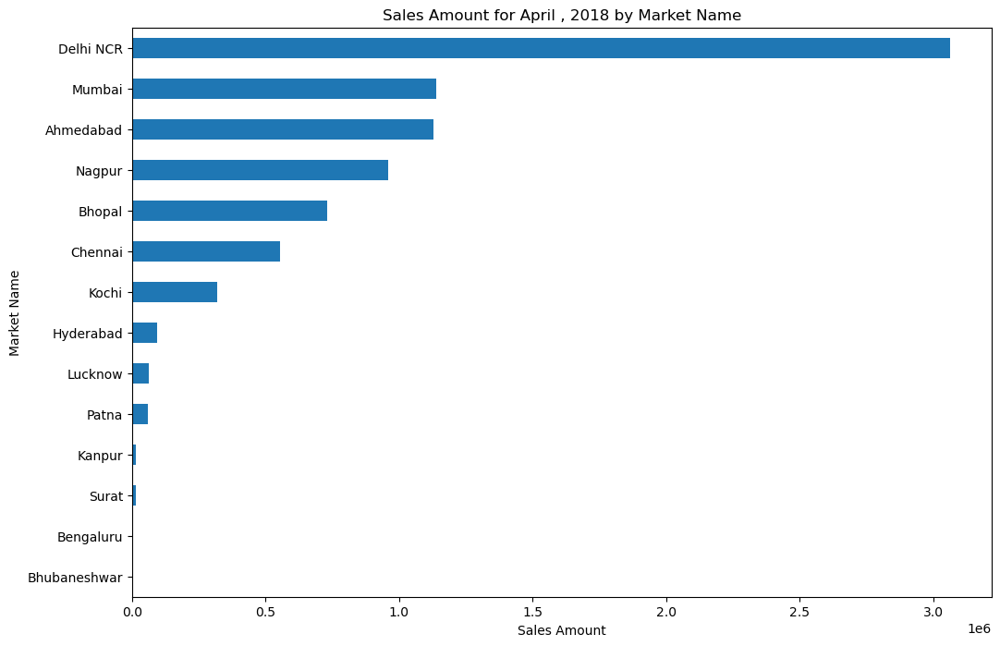

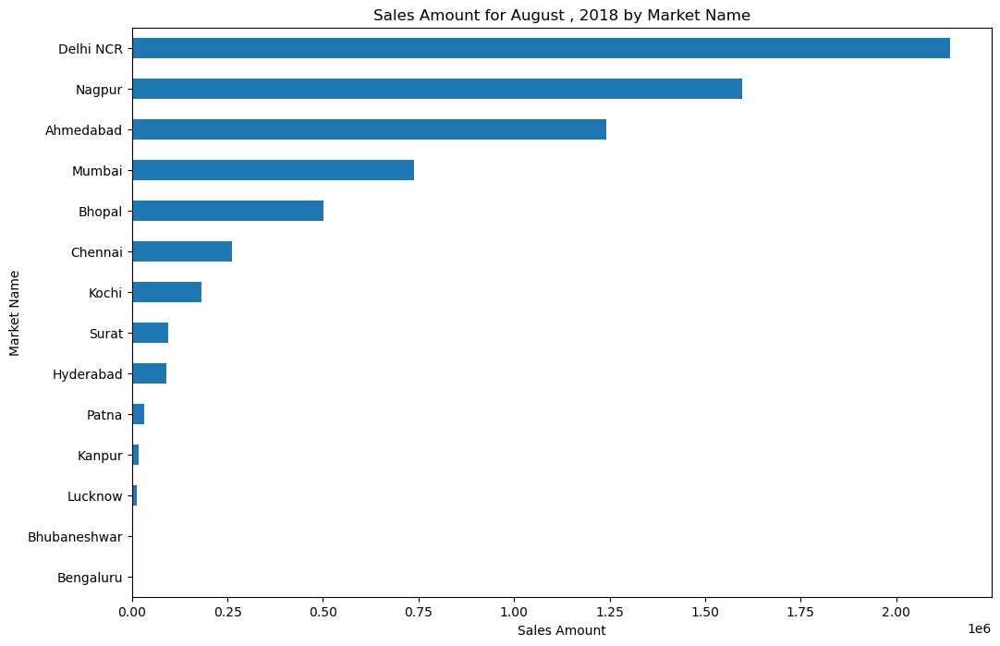

...

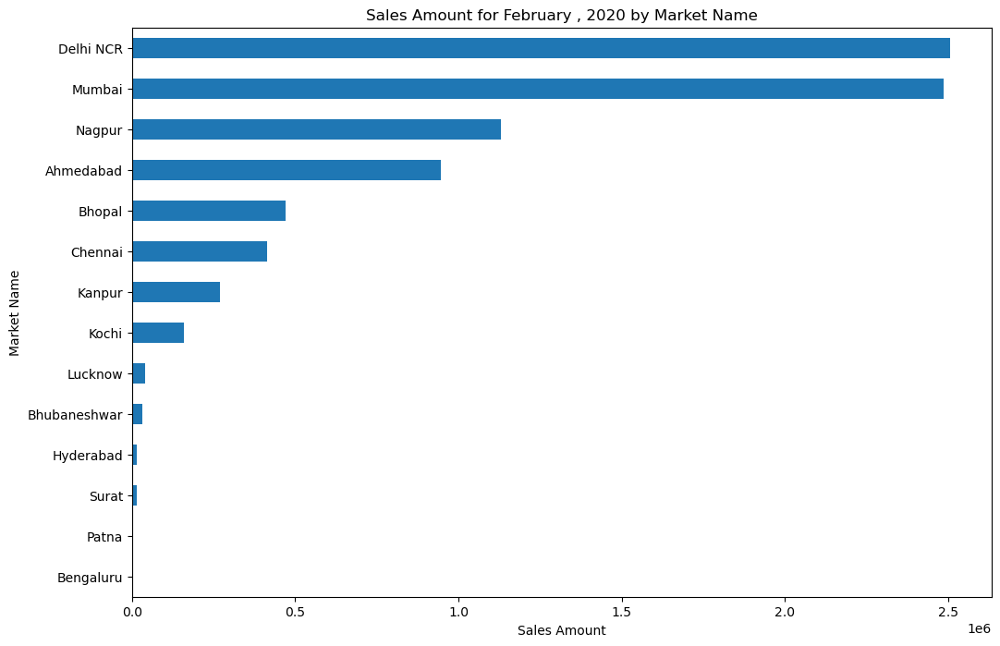

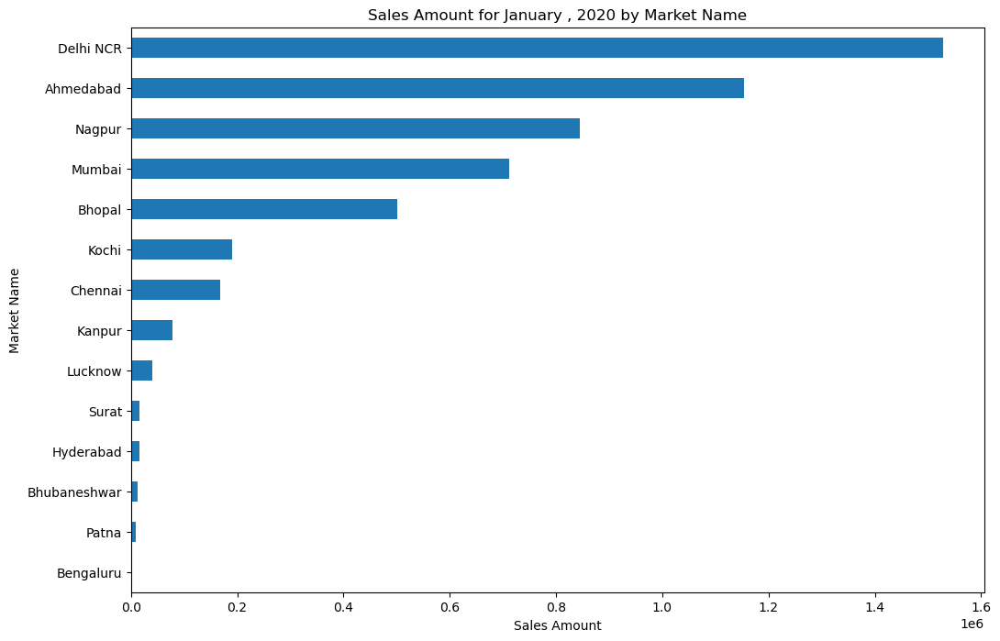

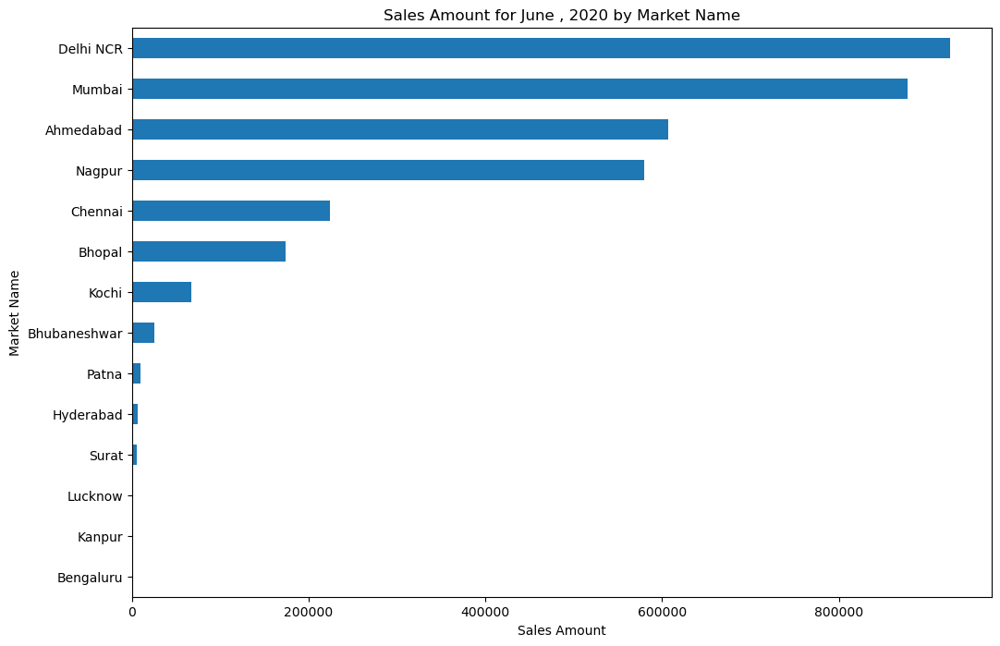

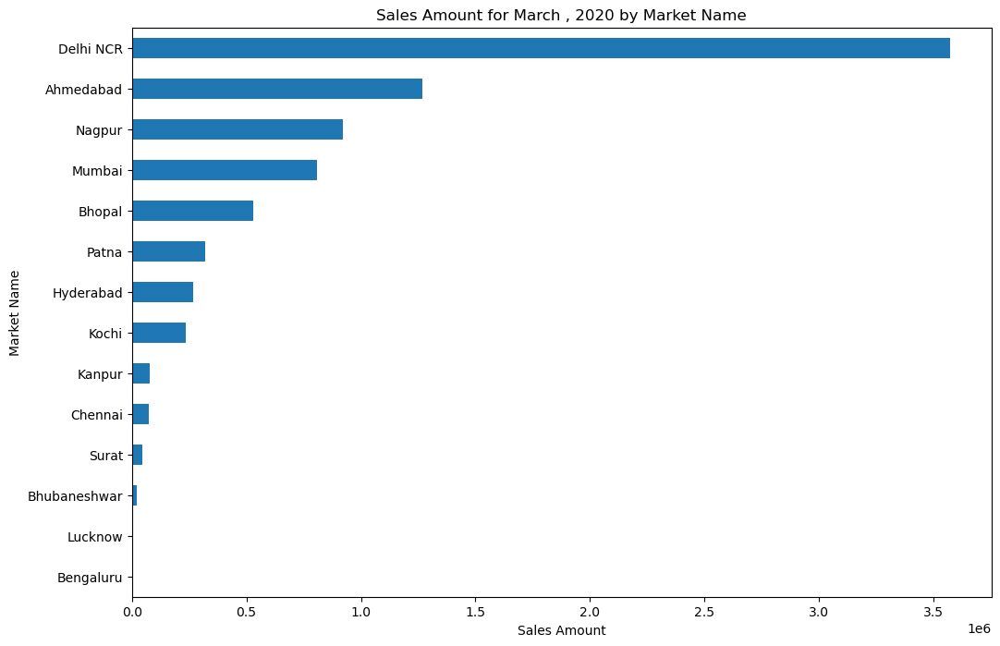

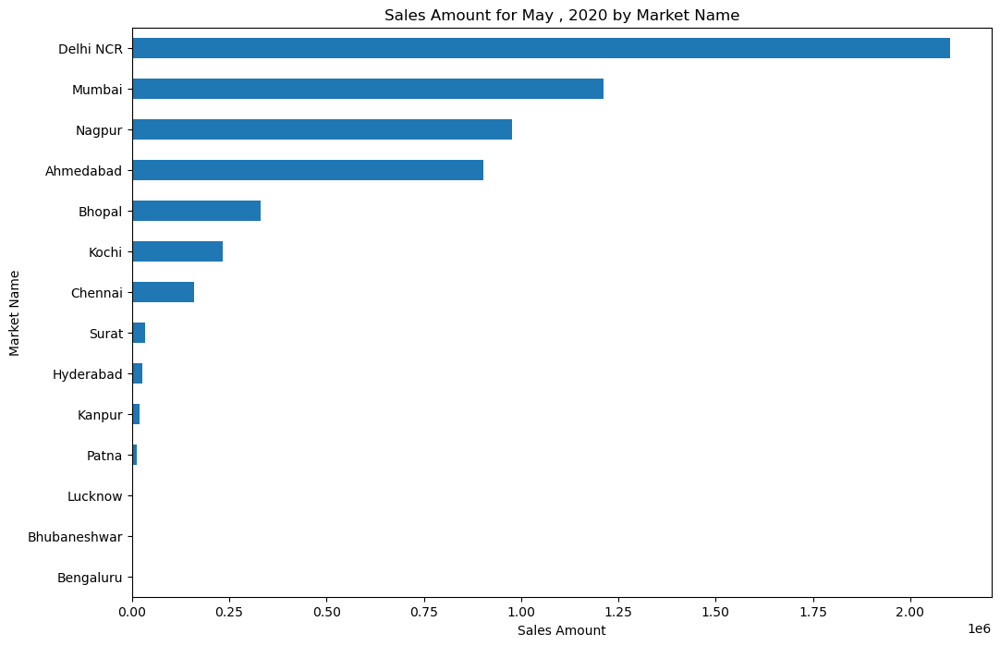

In [121]:
for i in amount_year_month_market_grp.index:
        amount_year_month_market_grp.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
        plt.xlabel("Sales Amount")
        plt.ylabel("Market Name")
        plt.title(f"Sales Amount for {i[1]} , {int(i[0])} by Market Name")
        plt.show()

### Total Sales Qty by Year , Month , Market

In [122]:
qty_year_month_market_grp = sales.groupby(["year","month_name","markets_name"]).sales_qty.sum().unstack(fill_value=0)
qty_year_month_market_grp

markets_name       Ahmedabad  Bengaluru  Bhopal  Bhubaneshwar  Chennai  \
year   month_name                                                        
2017.0 December       2729.0        0.0  1157.0          50.0    680.0   
       November       3019.0        0.0  1130.0          13.0    158.0   
       October        2521.0        0.0  1310.0           8.0    691.0   
2018.0 April          3203.0       40.0  1849.0           1.0    984.0   
       August         2939.0        0.0  1279.0           0.0    487.0   
       December       2617.0        0.0   953.0           0.0    307.0   
       February       2566.0        0.0   972.0           3.0    286.0   
       January        2647.0        0.0  1061.0          39.0    867.0   
       July           3843.0        0.0  2192.0           0.0     20.0   
       June           3273.0        0.0  1615.0           0.0    218.0   
       March          5110.0      158.0  1250.0          34.0     22.0   
       May            3564.0       10.0  2136.0           0.0    252.0   
       November       2984.0        0.0  1408.0          25.0    374.0   
       October        2518.0        0.0   851.0           0.0    189.0   
       September      2373.0        0.0  1475.0           0.0    142.0   
2019.0 April          3353.0        0.0  2048.0           0.0      9.0   
       August         3400.0        0.0  1868.0         183.0    126.0   
       December       3381.0        0.0   653.0           0.0    178.0   
       February       2603.0        0.0  1712.0           0.0    267.0   
       January        3872.0        0.0  2125.0         300.0     87.0   
       July           4979.0        0.0  1865.0           0.0     41.0   
       June           3739.0        0.0  1821.0         550.0    240.0   
       March          3583.0        0.0  1837.0        2016.0    233.0   
       May            3683.0        0.0  2516.0         400.0     80.0   
       November       2758.0        0.0  1345.0         187.0    174.0   
       October        2968.0        0.0  1041.0         185.0    323.0   
       September      2951.0        0.0  2140.0         183.0     24.0   
2020.0 April          3970.0        0.0  1017.0           0.0    207.0   
       February       2788.0        0.0  1381.0         833.0    944.0   
       January        3336.0        0.0  1157.0         332.0    493.0   
       June           1825.0        0.0   337.0         667.0    366.0   
       March          3886.0        0.0  1164.0         500.0    123.0   
       May            2699.0        0.0   810.0           0.0    493.0   

markets_name       Delhi NCR  Hyderabad  Kanpur    Kochi  Lucknow   Mumbai  \
year   month_name                                                            
2017.0 December       5974.0     2700.0    75.0   6833.0      0.0   7893.0   
       November       8421.0     1382.0    27.0   5996.0     66.0   6091.0   
       October        5842.0     1358.0    96.0   3724.0   4007.0   6088.0   
2018.0 April          5385.0     1256.0    26.0   6281.0    150.0   6447.0   
       August         2020.0     1539.0    29.0   4764.0   2667.0   2659.0   
       December       2254.0     2068.0    72.0   1251.0   4000.0   6197.0   
       February       6051.0     1468.0    20.0   4024.0     93.0  13082.0   
       January        8926.0     1530.0   268.0   3482.0    127.0   1824.0   
       July           2221.0      297.0   200.0    398.0    100.0  11157.0   
       June           3841.0     1406.0   125.0   8026.0     37.0   2723.0   
       March          6939.0     2981.0   312.0   8404.0    199.0   7519.0   
       May            9066.0     1145.0    64.0  11809.0    166.0   5847.0   
       November       1850.0     4685.0    50.0   2420.0   4000.0   1650.0   
       October        6615.0     4500.0    20.0   1882.0      0.0   2354.0   
       September      2004.0     3056.0    59.0    507.0      0.0   3357.0   
2019.0 April          1041.0      371.0    54.0   4408.0      0.0   1136.0   
     

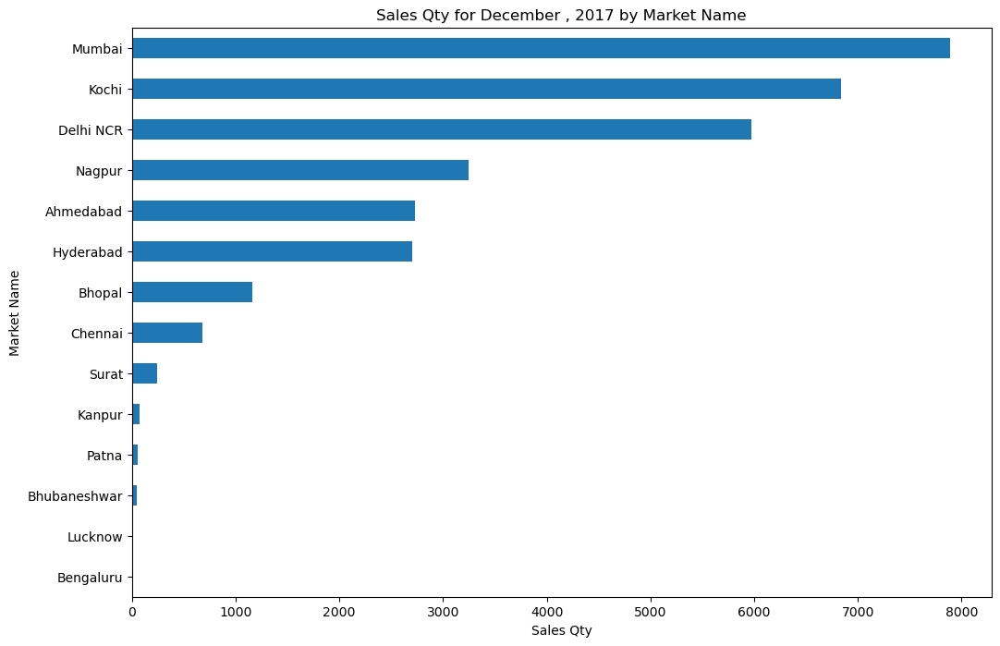

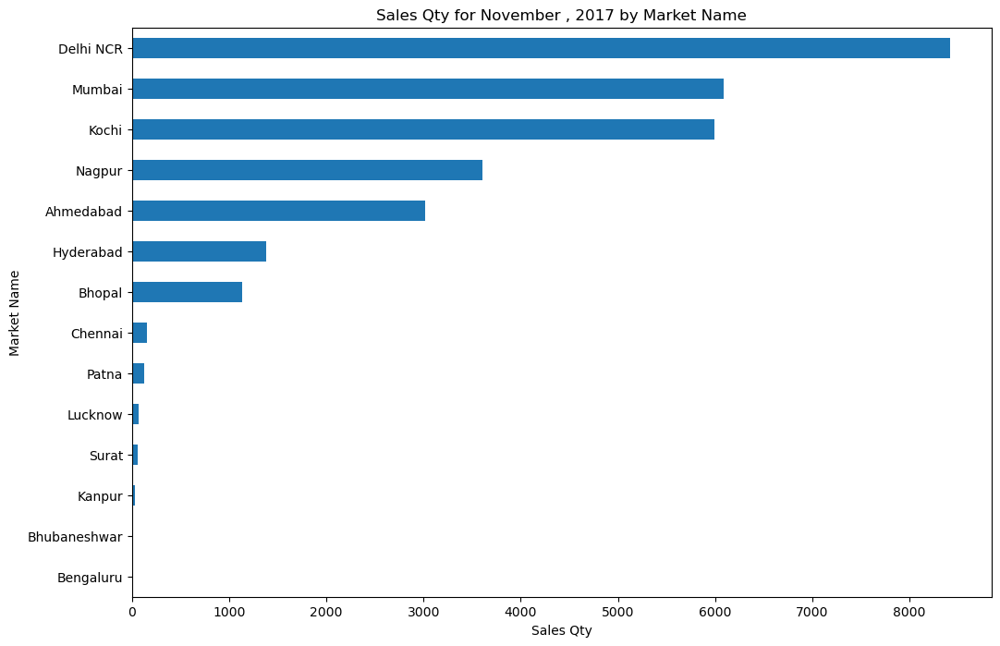

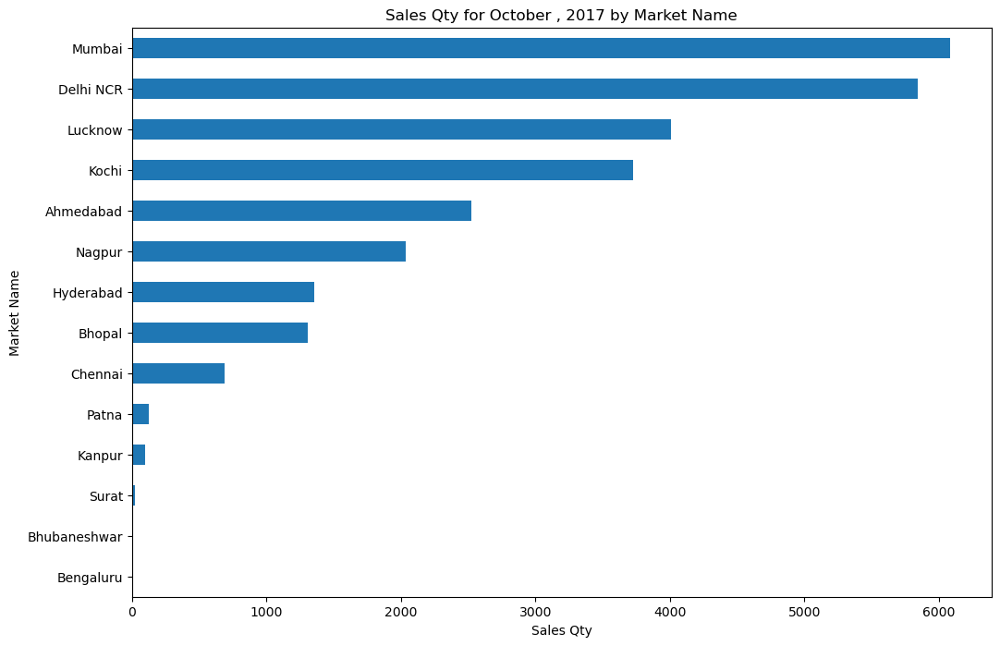

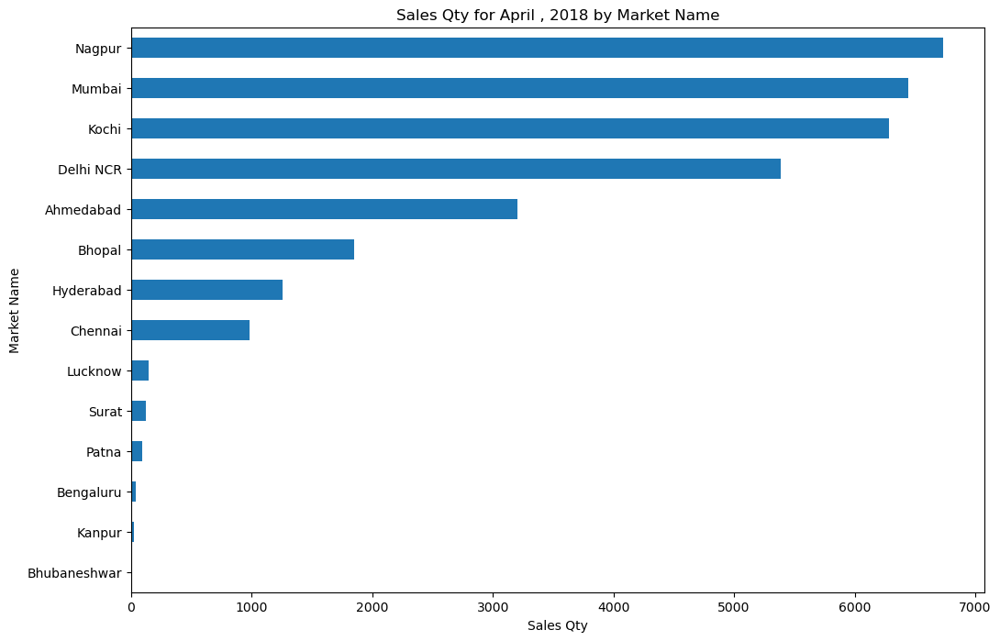

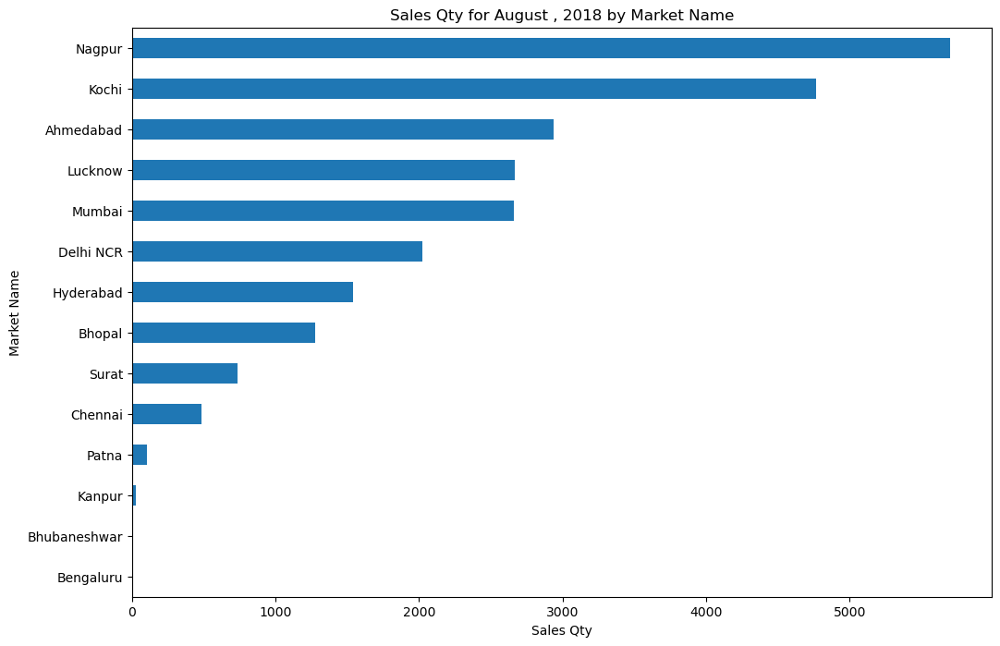

...

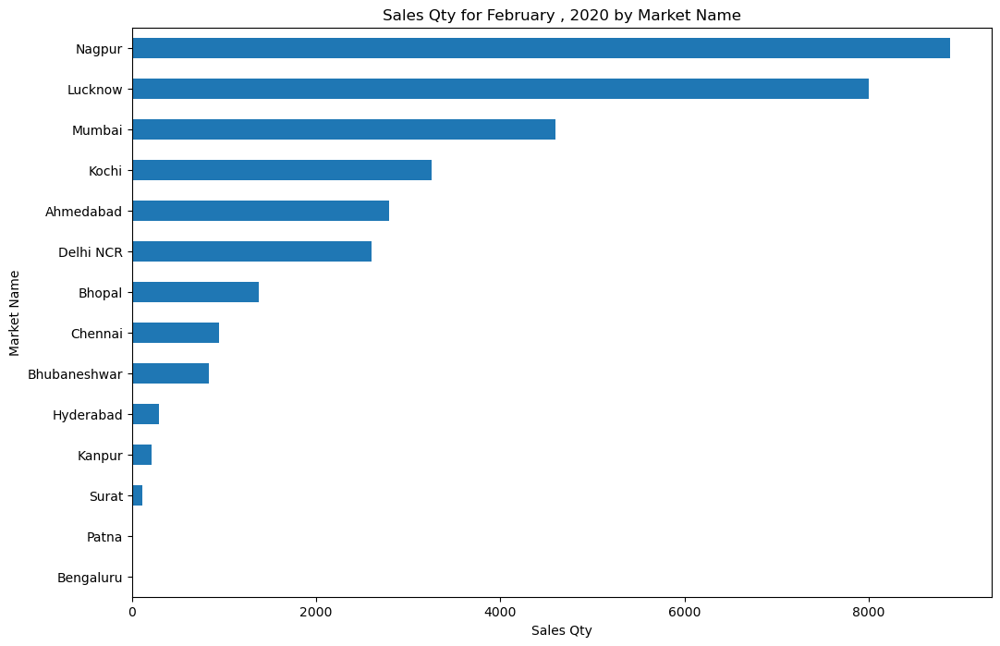

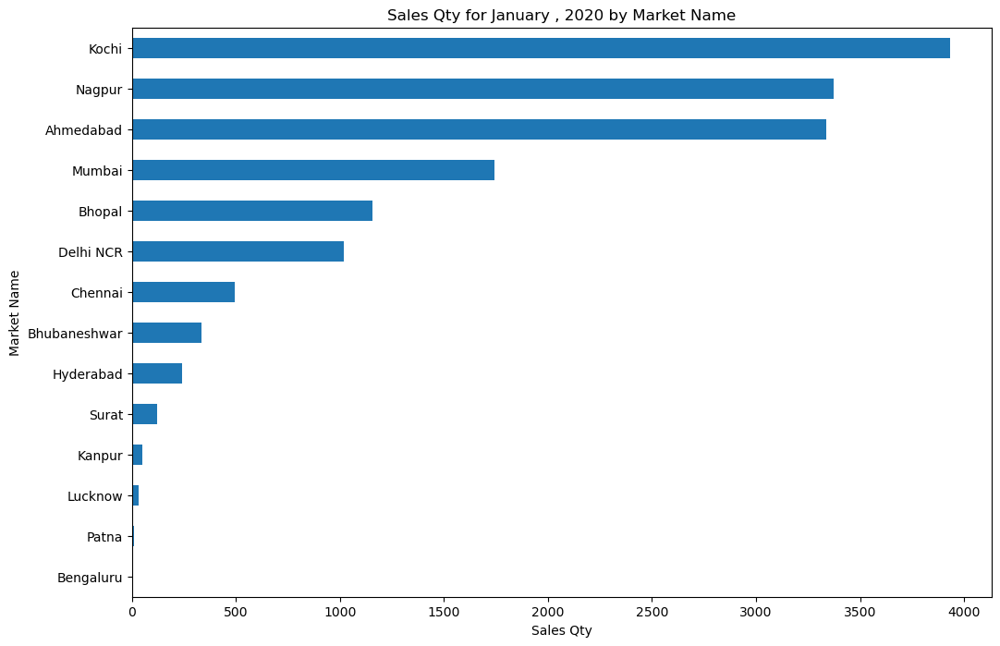

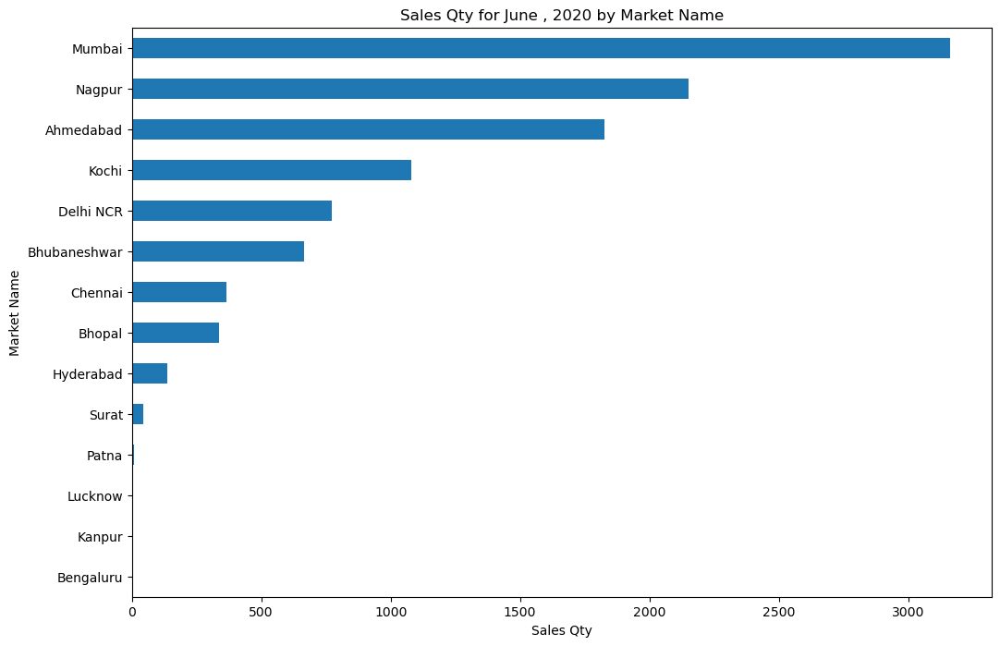

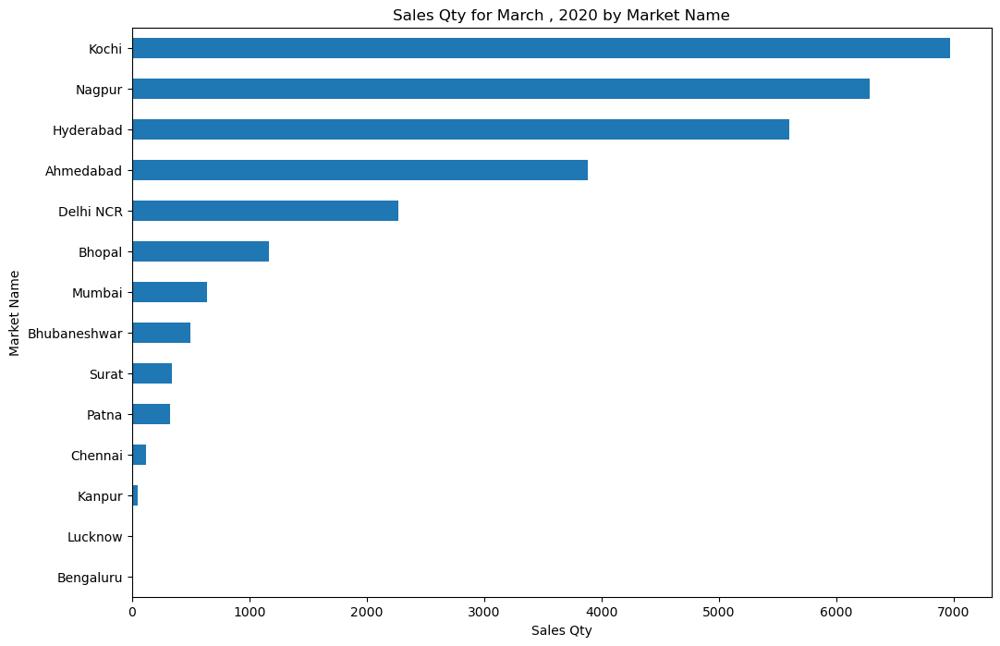

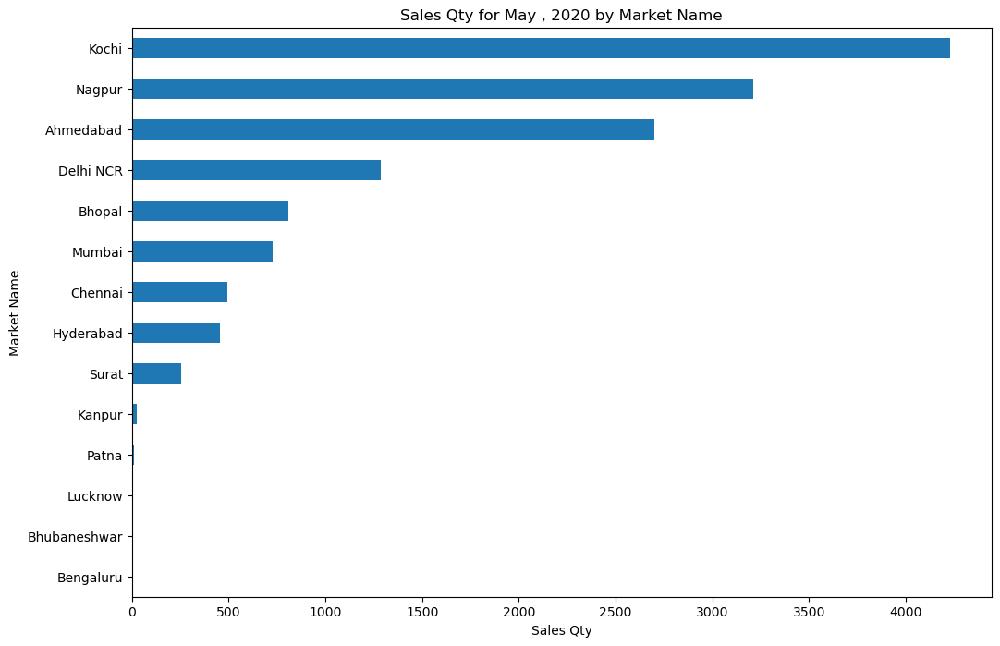

In [123]:
for i in qty_year_month_market_grp.index:
        qty_year_month_market_grp.loc[i].sort_values().plot(kind="barh",figsize=(12,8))
        plt.xlabel("Sales Qty")
        plt.ylabel("Market Name")
        plt.title(f"Sales Qty for {i[1]} , {int(i[0])} by Market Name")
        plt.show()

### Top 5 Customer Name by Total Sales Amount

In [124]:
amount_by_customer = sales.groupby("customer_name").sales_amount.sum()
top_5_customer_by_amount = amount_by_customer.nlargest(5)
top_5_customer_by_amount

customer_name
Electricalsara Stores    55150457.0
Excel Stores             18968973.0
Info Stores              18012275.0
Electricalslytical       15285587.0
Modular                  12953118.0
Name: sales_amount, dtype: float64

### Top 5 Product by Total Sales Amount

In [125]:
amount_by_product = sales.groupby("product_code").sales_amount.sum()
amount_by_product

product_code
Prod001      41241.0
Prod002       8634.0
Prod003     417773.0
Prod004      29926.0
Prod005     632573.0
             ...    
Prod109       3046.0
Prod110    1672699.0
Prod111         65.0
Prod112       8444.0
Prod113    3895096.0
Name: sales_amount, Length: 113, dtype: float64

In [128]:
top_5_product_by_amount = amount_by_product.nlargest(5)
top_5_product_by_amount

product_code
Prod040    23581969.0
Prod065    16259345.0
Prod018    15597920.0
Prod053    15135392.0
Prod090    13418817.0
Name: sales_amount, dtype: float64

In [134]:
sales["year"] = sales["year"].astype(int)

### show total revenue chart by date 

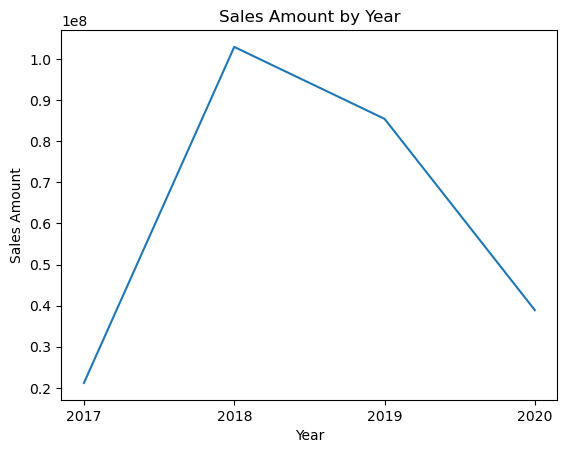

In [141]:
amount_by_year = sales.groupby("year").sales_amount.sum()
amount_by_year.plot()
plt.xlabel("Year")
plt.ylabel("Sales Amount")
plt.title("Sales Amount by Year")
x_tiks = []
for i in amount_by_year.index:
    x_tiks.append(i)
plt.xticks(x_tiks)

plt.show()

### Show Total Revenue chart by Year , Month

In [145]:
amount_by_year_month = sales.groupby(["year","month_name"]).sales_amount.sum().unstack(fill_value=0)
amount_by_year_month

month_name,April,August,December,February,January,July,June,March,May,November,October,September
year,,,,,,,,,,,,
2017,0.0,0.0,7632946.0,0.0,0.0,0.0,0.0,0.0,0.0,7432743.0,6131916.0,0.0
2018,8151389.0,6913100.0,7712809.0,9529763.0,15634444.0,7251368.0,8027119.0,12636121.0,7997672.0,6717376.0,5883614.0,6494255.0
2019,6296270.0,8462144.0,5648672.0,6227718.0,6539985.0,9916818.0,7053112.0,6424413.0,6945703.0,6743764.0,7710839.0,7479626.0
2020,7495538.0,0.0,0.0,8483016.0,5273749.0,0.0,3503243.0,8139961.0,6011094.0,0.0,0.0,0.0


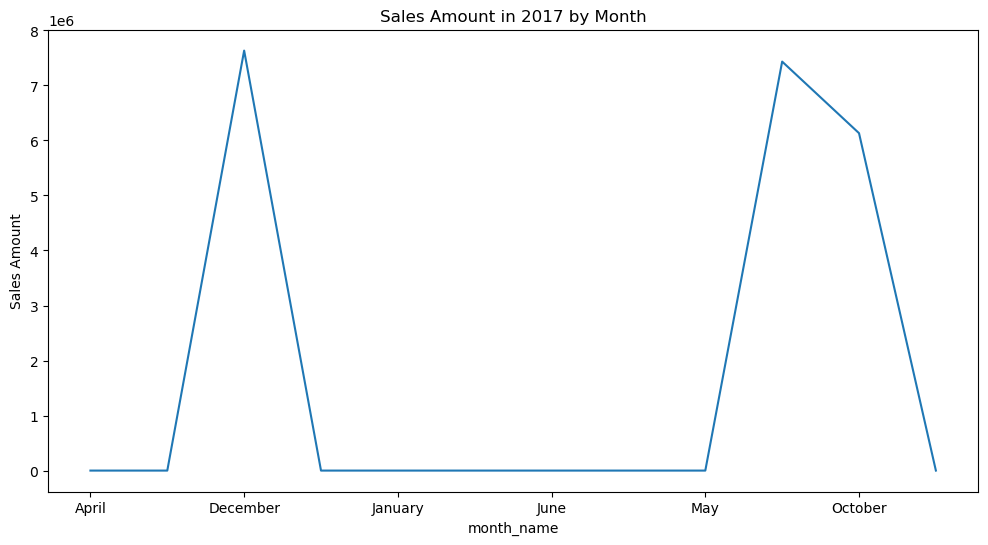

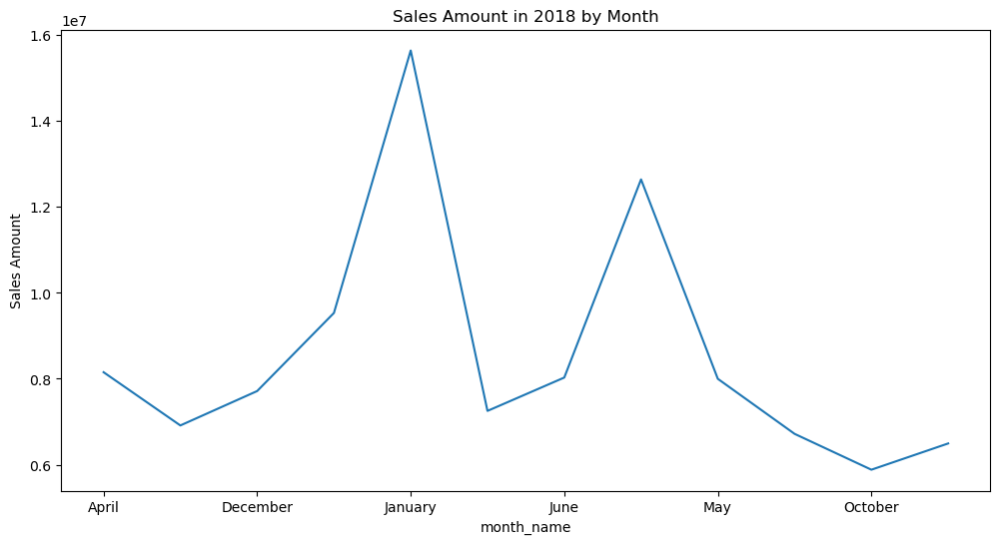

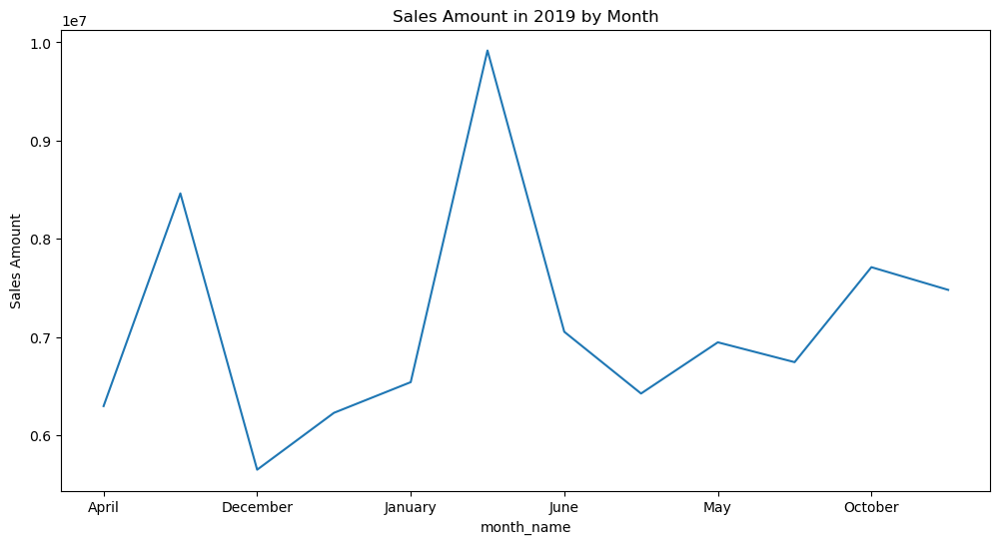

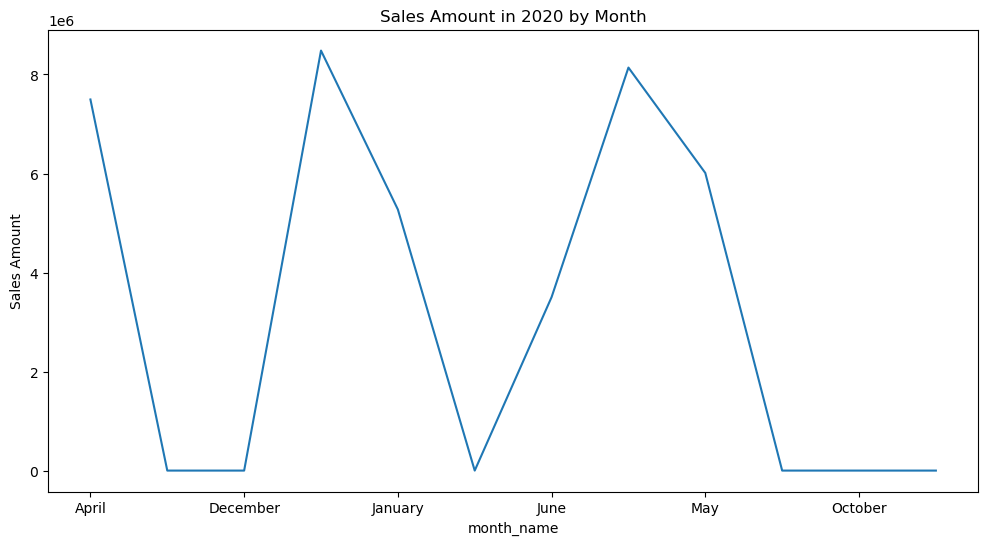

In [150]:
for i in amount_by_year_month.index:
    amount_by_year_month.loc[i].plot(figsize=(12,6))
    plt.x
    plt.ylabel("Sales Amount")
    plt.title(f"Sales Amount in {i} by Month")
    plt.show()